# TRABAJO PRÁCTICO INTEGRADOR GRUPAL: INTELIGENCIA DE DATOS

**Dataset asignado: 5 - Santiago del Estero**


## Análisis de datos

In [1]:
import seaborn as sns
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import warnings

warnings.filterwarnings('ignore')

#PROCESAMIENTO DE LOS DATOS


### Carga de datasets

In [2]:
# OPCIÓN 2: CARGAR DESDE DIRECTORIO CORRIENDO EN PC LOCAL

# Cargamos las dos hojas que hay en cada planilla de Excel en dataframe diferentes
data1='./Assets/A872811.xls'
data2='./Assets/A872812.xls'
data3='./Assets/A872954.xls'

solar1=pd.read_excel(data1, sheet_name='Datos diarios', parse_dates=True, na_values=['', ' ', '  ', '   '])
solar2=pd.read_excel(data2, sheet_name='Datos diarios', parse_dates=True, na_values=['', ' ', '  ', '   '])
solar3=pd.read_excel(data3, sheet_name='Datos diarios', parse_dates=True, na_values=['', ' ', '  ', '   '])

estacion1=pd.read_excel(data1, sheet_name='Datos estacion')
estacion2=pd.read_excel(data2, sheet_name='Datos estacion')
estacion3=pd.read_excel(data3, sheet_name='Datos estacion')

In [3]:
solar1.columns

Index(['Fecha', 'Temperatura_Abrigo_150cm', 'Temperatura_Abrigo_150cm_Maxima',
       'Temperatura_Abrigo_150cm_Minima', 'Temperatura_Intemperie_5cm_Minima',
       'Temperatura_Intemperie_50cm_Minima', 'Temperatura_Suelo_5cm_Media',
       'Temperatura_Suelo_10cm_Media', 'Temperatura_Inte_5cm',
       'Temperatura_Intemperie_150cm_Minima', 'Humedad_Suelo',
       'Precipitacion_Pluviometrica', 'Precipitacion_Cronologica',
       'Precipitacion_Maxima_30minutos', 'Heliofania_Efectiva',
       'Heliofania_Relativa', 'Tesion_Vapor_Media', 'Humedad_Media',
       'Humedad_Media_8_14_20', 'Rocio_Medio', 'Duracion_Follaje_Mojado',
       'Velocidad_Viento_200cm_Media', 'Direccion_Viento_200cm',
       'Velocidad_Viento_1000cm_Media', 'Direccion_Viento_1000cm',
       'Velocidad_Viento_Maxima', 'Presion_Media', 'Radiacion_Global',
       'Horas_Frio', 'Unidades_Frio'],
      dtype='object')

In [5]:
# Verificamos que las características de los datos de las 3 estaciones coinciden
assert(solar1.columns == solar2.columns).all()
assert(solar1.columns == solar3.columns).all()
assert(estacion1.columns == estacion2.columns).all()
assert(estacion1.columns == estacion3.columns).all()

## Tipos de datos para Datos Diarios


In [6]:
solar1.info() # hay datos nulos

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4492 entries, 0 to 4491
Data columns (total 30 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Fecha                                4492 non-null   object 
 1   Temperatura_Abrigo_150cm             4294 non-null   float64
 2   Temperatura_Abrigo_150cm_Maxima      4323 non-null   float64
 3   Temperatura_Abrigo_150cm_Minima      4355 non-null   float64
 4   Temperatura_Intemperie_5cm_Minima    0 non-null      float64
 5   Temperatura_Intemperie_50cm_Minima   0 non-null      float64
 6   Temperatura_Suelo_5cm_Media          0 non-null      float64
 7   Temperatura_Suelo_10cm_Media         4376 non-null   float64
 8   Temperatura_Inte_5cm                 0 non-null      float64
 9   Temperatura_Intemperie_150cm_Minima  0 non-null      float64
 10  Humedad_Suelo                        0 non-null      float64
 11  Precipitacion_Pluviometrica   

In [16]:
solar2.info() # hay datos nulos

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4522 entries, 0 to 4521
Data columns (total 30 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Fecha                                4522 non-null   object 
 1   Temperatura_Abrigo_150cm             4263 non-null   float64
 2   Temperatura_Abrigo_150cm_Maxima      4249 non-null   float64
 3   Temperatura_Abrigo_150cm_Minima      4249 non-null   float64
 4   Temperatura_Intemperie_5cm_Minima    0 non-null      float64
 5   Temperatura_Intemperie_50cm_Minima   0 non-null      float64
 6   Temperatura_Suelo_5cm_Media          0 non-null      float64
 7   Temperatura_Suelo_10cm_Media         4211 non-null   float64
 8   Temperatura_Inte_5cm                 0 non-null      float64
 9   Temperatura_Intemperie_150cm_Minima  0 non-null      float64
 10  Humedad_Suelo                        0 non-null      float64
 11  Precipitacion_Pluviometrica   

In [17]:
solar3.info() # hay datos nulos

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2961 entries, 0 to 2960
Data columns (total 30 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Fecha                                2961 non-null   object 
 1   Temperatura_Abrigo_150cm             2600 non-null   float64
 2   Temperatura_Abrigo_150cm_Maxima      2577 non-null   float64
 3   Temperatura_Abrigo_150cm_Minima      2577 non-null   float64
 4   Temperatura_Intemperie_5cm_Minima    0 non-null      float64
 5   Temperatura_Intemperie_50cm_Minima   0 non-null      float64
 6   Temperatura_Suelo_5cm_Media          0 non-null      float64
 7   Temperatura_Suelo_10cm_Media         2572 non-null   float64
 8   Temperatura_Inte_5cm                 0 non-null      float64
 9   Temperatura_Intemperie_150cm_Minima  0 non-null      float64
 10  Humedad_Suelo                        0 non-null      float64
 11  Precipitacion_Pluviometrica   

###En los 3 dataframes solar1, 2 y 3 hay datos faltantes en casi todas las características


##Tipos de datos para estaciones

In [18]:
estacion1.info() # No hay datos nulos

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1 entries, 0 to 0
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Id Interno   1 non-null      object 
 1   Nombre       1 non-null      object 
 2   Descripcion  1 non-null      object 
 3   Localidad    1 non-null      object 
 4   Provincia    1 non-null      object 
 5   Latitud      1 non-null      float64
 6   Longitud     1 non-null      float64
dtypes: float64(2), object(5)
memory usage: 188.0+ bytes


In [19]:
estacion2.info() # No hay datos nulos

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1 entries, 0 to 0
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Id Interno   1 non-null      object 
 1   Nombre       1 non-null      object 
 2   Descripcion  1 non-null      object 
 3   Localidad    1 non-null      object 
 4   Provincia    1 non-null      object 
 5   Latitud      1 non-null      float64
 6   Longitud     1 non-null      float64
dtypes: float64(2), object(5)
memory usage: 188.0+ bytes


In [20]:
estacion3.info() # No hay datos nulos

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1 entries, 0 to 0
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Id Interno   1 non-null      object 
 1   Nombre       1 non-null      object 
 2   Descripcion  1 non-null      object 
 3   Localidad    1 non-null      object 
 4   Provincia    1 non-null      object 
 5   Latitud      1 non-null      float64
 6   Longitud     1 non-null      float64
dtypes: float64(2), object(5)
memory usage: 188.0+ bytes


### Concatenar dataframes
Observamos que los 3 dataframes con datos meteorológicos provienen cada uno de distintas estaciones. Se agregará a cada uno una columna 'Estacion' y luego se concatenarán los 3 dataframes.

In [15]:
solar1['Estacion']=estacion1['Nombre'][0]
solar2['Estacion']=estacion2['Nombre'][0]
solar3['Estacion']=estacion3['Nombre'][0]
solar1.head()

,Fecha,Temperatura_Abrigo_150cm,Temperatura_Abrigo_150cm_Maxima,Temperatura_Abrigo_150cm_Minima,Temperatura_Intemperie_5cm_Minima,Temperatura_Intemperie_50cm_Minima,Temperatura_Suelo_5cm_Media,Temperatura_Suelo_10cm_Media,Temperatura_Inte_5cm,Temperatura_Intemperie_150cm_Minima,...,Velocidad_Viento_200cm_Media,Direccion_Viento_200cm,Velocidad_Viento_1000cm_Media,Direccion_Viento_1000cm,Velocidad_Viento_Maxima,Presion_Media,Radiacion_Global,Horas_Frio,Unidades_Frio,Estacion
0,2010-12-14 00:00:00.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Bandera - EEA E Santiago
1,2010-12-15 00:00:00.0,25.53263,35.4,14.7,NaN,NaN,NaN,28.00834,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,-19.83702,Bandera - EEA E Santiago
2,2010-12-16 00:00:00.0,27.98403,38.0,17.3,NaN,NaN,NaN,29.55556,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,-23.57203,Bandera - EEA E Santiago
3,2010-12-17 00:00:00.0,31.04236,40.7,22.3,NaN,NaN,NaN,31.31250,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,-23.90403,Bandera - EEA E Santiago
4,2010-12-18 00:00:00.0,30.07361,39.1,23.3,NaN,NaN,NaN,31.36250,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,-23.90403,Bandera - EEA E Santiago


In [16]:
solar=pd.concat([solar1, solar2, solar3])
solar.shape

(11975, 31)

In [18]:
# Hay columnas enteras con datos nulos, se eliminan. Son 6 columnas
solar.dropna(axis=1, how='all', inplace=True)
solar.shape

(11975, 25)

In [19]:
# Eliminar filas enteras con datos nulos, excepto la fecha y la estacion
solar.dropna(axis=0, thresh=3, inplace=True)
# thresh=3: requiere al menos 3 valores no nulos para conservar la fila.

In [20]:
#resetear índices para evitar valores duplicados
solar.reset_index(drop=True, inplace=True)
solar.head()

,Fecha,Temperatura_Abrigo_150cm,Temperatura_Abrigo_150cm_Maxima,Temperatura_Abrigo_150cm_Minima,Temperatura_Suelo_10cm_Media,Precipitacion_Pluviometrica,Precipitacion_Cronologica,Precipitacion_Maxima_30minutos,Heliofania_Efectiva,Heliofania_Relativa,...,Velocidad_Viento_200cm_Media,Direccion_Viento_200cm,Velocidad_Viento_1000cm_Media,Direccion_Viento_1000cm,Velocidad_Viento_Maxima,Presion_Media,Radiacion_Global,Horas_Frio,Unidades_Frio,Estacion
0,2010-12-15 00:00:00.0,25.53263,35.4,14.7,28.00834,0.0,0.000000,0.000000,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,-19.83702,Bandera - EEA E Santiago
1,2010-12-16 00:00:00.0,27.98403,38.0,17.3,29.55556,0.0,0.000000,0.000000,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,-23.57203,Bandera - EEA E Santiago
2,2010-12-17 00:00:00.0,31.04236,40.7,22.3,31.31250,0.0,0.000000,0.000000,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,-23.90403,Bandera - EEA E Santiago
3,2010-12-18 00:00:00.0,30.07361,39.1,23.3,31.36250,10.2,9.900001,9.900001,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,-23.90403,Bandera - EEA E Santiago
4,2010-12-19 00:00:00.0,23.78195,29.2,20.2,26.30139,16.2,0.300000,0.300000,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,-23.90403,Bandera - EEA E Santiago


In [21]:
solar.shape

(11503, 25)

### Tipos de datos:
De las 25 características, hay 1 tipo fecha ('Fecha':'object'), 3 de tipo categórico ('Estacion', 'Direccion_Viento_200cm' y 'Direccion_Viento_1000cm': tipo 'object') y las restantes 21 son de tipo 'float'. A continuación observaremos qué valores toman las características categóricas.



In [22]:
solar.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11503 entries, 0 to 11502
Data columns (total 25 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Fecha                            11503 non-null  object 
 1   Temperatura_Abrigo_150cm         11157 non-null  float64
 2   Temperatura_Abrigo_150cm_Maxima  11149 non-null  float64
 3   Temperatura_Abrigo_150cm_Minima  11181 non-null  float64
 4   Temperatura_Suelo_10cm_Media     11159 non-null  float64
 5   Precipitacion_Pluviometrica      11034 non-null  float64
 6   Precipitacion_Cronologica        10993 non-null  float64
 7   Precipitacion_Maxima_30minutos   10623 non-null  float64
 8   Heliofania_Efectiva              6810 non-null   float64
 9   Heliofania_Relativa              6807 non-null   float64
 10  Tesion_Vapor_Media               10934 non-null  float64
 11  Humedad_Media                    11168 non-null  float64
 12  Humedad_Media_8_14

In [23]:
solar['Estacion'].unique()

array(['Bandera - EEA E Santiago', 'Sachayoj - EEA E Santiago',
       'Monte Quemado - EEA E Santiago'], dtype=object)

In [24]:
solar['Direccion_Viento_200cm'].unique()

array([nan, 'C ', 'NE', 'S ', 'N ', 'SE', 'E ', 'W ', 'NW'], dtype=object)

In [25]:
solar['Direccion_Viento_1000cm'].unique()

array([nan, 'C '], dtype=object)

### Codificación de características categóricas
Las características categóricas deben ser codificadas para que el algoritmo de ML que se aplique pueda ingerirlas. Guardaremos cada una de ellas para graficarlas con un catplot.
#####Se aplicará una codificación tipo OneHot sobre ellas: en Pandas el método .get_dummies() ejecuta ese tipo de transformación.

In [26]:
# Guardar características categóricas para graficar

estacion=solar['Estacion']
dir_vto_200=solar['Direccion_Viento_200cm']
dir_vto_1000=solar['Direccion_Viento_1000cm']

In [27]:
solar=pd.get_dummies(solar, columns=['Estacion', 'Direccion_Viento_200cm', 'Direccion_Viento_1000cm'], dummy_na=False)
solar.shape

(11503, 34)

### Cantidad de datos

In [28]:
print(f'Cantidad de datos en solar: {solar.shape}')


Cantidad de datos en solar: (11503, 34)


## Gráficos: Histogramas, Boxplot, Catplot, PairPlot y Correlación
A continuación se desarrollarán graficos que nos van a permitir visualizar los datos y elaborar conclusiones sobre los mismos


### Histogramas

array([[<Axes: title={'center': 'Temperatura_Abrigo_150cm'}>,
        <Axes: title={'center': 'Temperatura_Abrigo_150cm_Maxima'}>,
        <Axes: title={'center': 'Temperatura_Abrigo_150cm_Minima'}>,
        <Axes: title={'center': 'Temperatura_Suelo_10cm_Media'}>,
        <Axes: title={'center': 'Precipitacion_Pluviometrica'}>],
       [<Axes: title={'center': 'Precipitacion_Cronologica'}>,
        <Axes: title={'center': 'Precipitacion_Maxima_30minutos'}>,
        <Axes: title={'center': 'Heliofania_Efectiva'}>,
        <Axes: title={'center': 'Heliofania_Relativa'}>,
        <Axes: title={'center': 'Tesion_Vapor_Media'}>],
       [<Axes: title={'center': 'Humedad_Media'}>,
        <Axes: title={'center': 'Humedad_Media_8_14_20'}>,
        <Axes: title={'center': 'Rocio_Medio'}>,
        <Axes: title={'center': 'Duracion_Follaje_Mojado'}>,
        <Axes: title={'center': 'Velocidad_Viento_200cm_Media'}>],
       [<Axes: title={'center': 'Velocidad_Viento_1000cm_Media'}>,
        <Axe

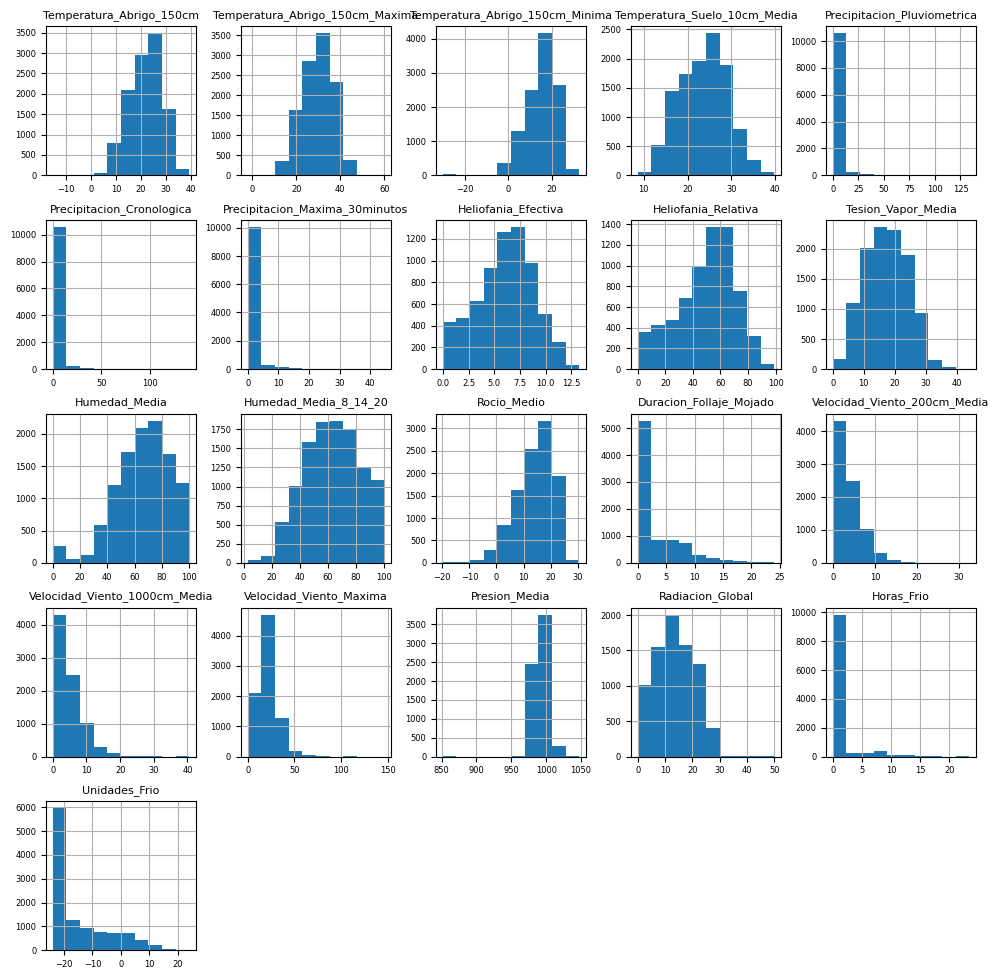

In [34]:
params = {'axes.titlesize':'8',
          'xtick.labelsize':'6',
          'ytick.labelsize':'6'}
plt.rcParams.update(params)
solar.hist(figsize=(12,12))

### Boxplot

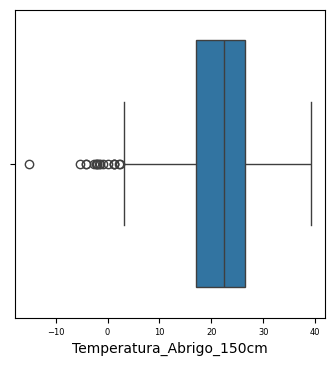

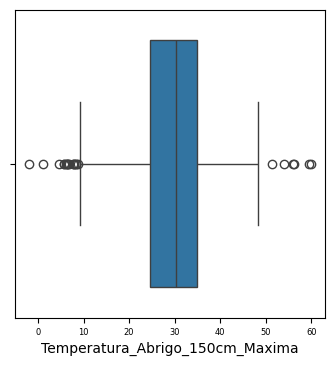

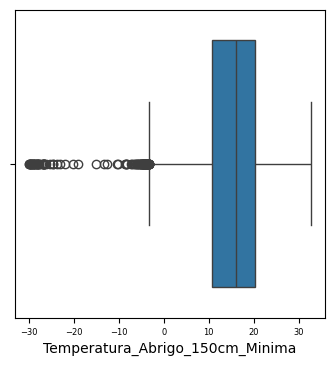

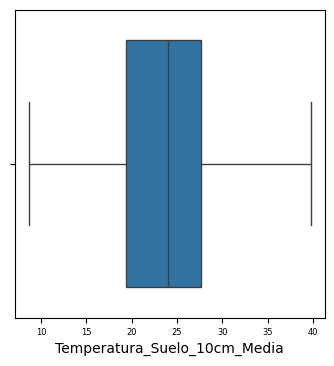

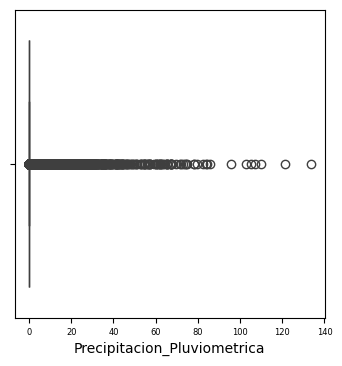

...

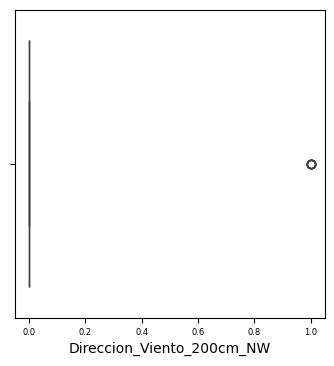

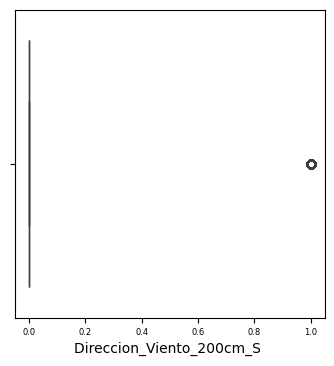

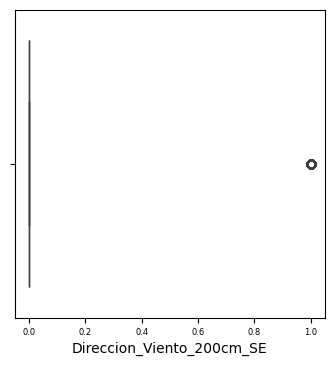

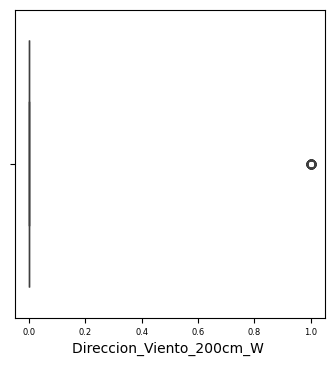

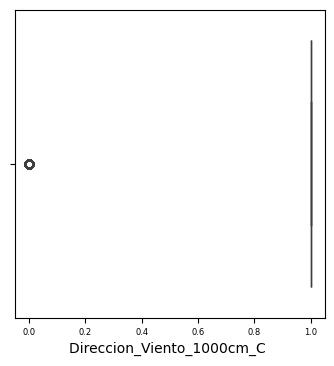

In [35]:
for col in solar.columns[1:]: # se excluye la Fecha
    plt.figure(figsize=(4, 4))
    sns.boxplot(x=solar[col])
    plt.show()

Los diagramas Boxplot nos permiten ver la distribución de los datos para cada característica: mediana, primer y tercer cuartil, valor mínimo y máximo y valores atípicos (entendidos como aquellos alejados más de 3 desvíos estándar de la mediana)

* Observamos que casi todas las características tienen valores atípicos.


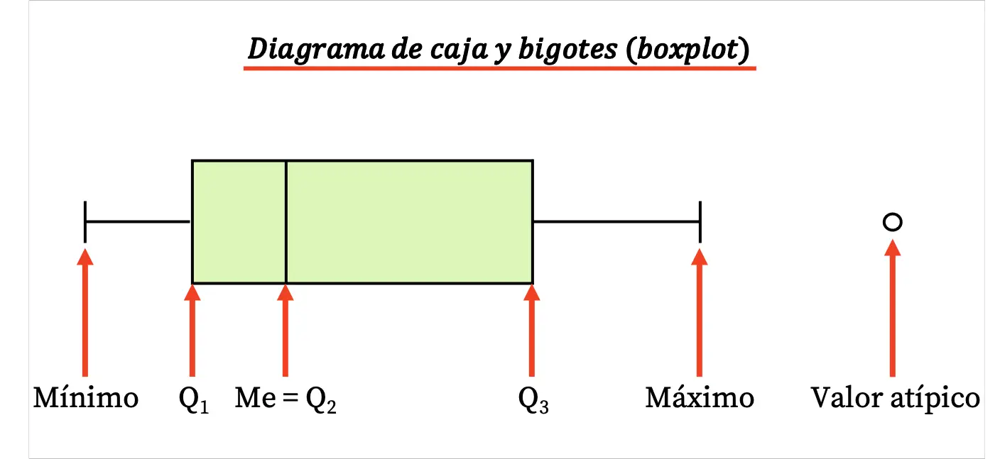

###Catplot de las características categóricas


<Figure size 400x400 with 0 Axes>

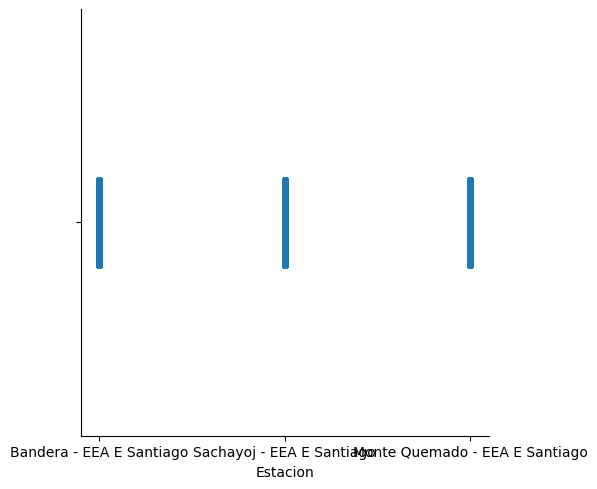

<Figure size 400x400 with 0 Axes>

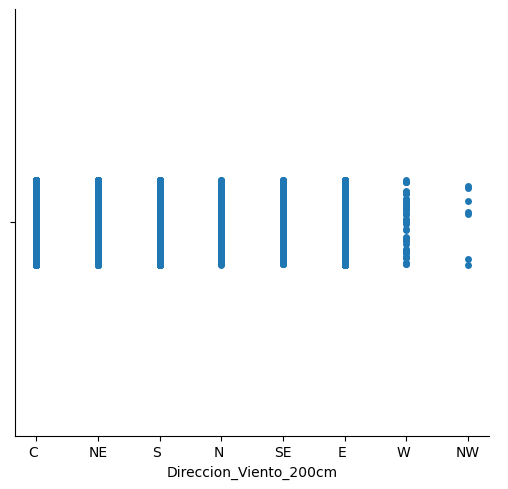

<Figure size 400x400 with 0 Axes>

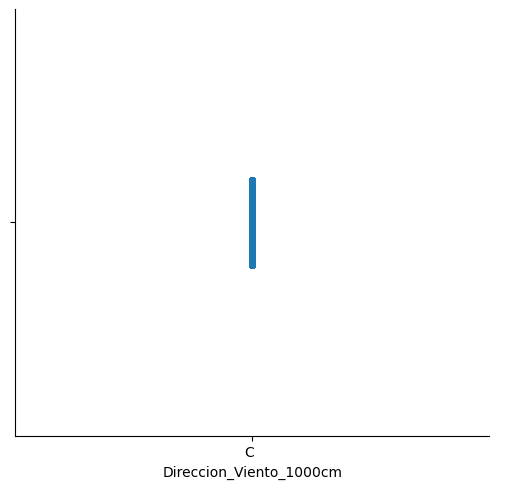

In [29]:
# Haremos un gráfico catplot sobre las características categóricas sin codificar
categ=[estacion, dir_vto_200, dir_vto_1000]

for ca in categ:
    plt.figure(figsize=(4, 4))
    sns.catplot(x=ca)
    plt.show()


###Pairplot

In [30]:
sns.pairplot(data=solar, corner=True)


Los gráficos de Pairplot nos permiten ver relaciones entre todas las variables tomadas de a pares. Por ejemplo, vemos relaciones entre variables, como:

*   'Velocidad_Viento_200cm_Media'y 'Velocidad_Viento_1000cm_Media' (lineal)
*   'Heliofania_Relativa' y 'Heliofania_Efectiva' (lineal)
*   'Radiacion_Global' con 'Heliofania_Relativa' y 'Heliofania_Efectiva' (lineal)
*   'Humedad_Media_8_14_20' y 'Humedad_Media' (polinomial, quizá grado 2)
*   'Rocio_Medio' y 'Tension_Vapor_Media' (polinomial, quizás grado 2)






###Estadísticos de las características del dataset


*   Primero veremos el dataset transformado
*   Veremos las características categóricas originales



In [31]:
solar.describe().T

,count,mean,std,min,25%,50%,75%,max
Temperatura_Abrigo_150cm,11157.0,21.736769,6.365263,-15.148910,17.084720,22.401410,26.479170,39.17014
Temperatura_Abrigo_150cm_Maxima,11149.0,29.710422,7.097521,-2.000000,24.600000,30.200000,35.000000,59.90000
Temperatura_Abrigo_150cm_Minima,11181.0,14.997612,7.129189,-30.000000,10.800000,16.100000,20.200000,32.70000
Temperatura_Suelo_10cm_Media,11159.0,23.632825,5.428979,8.665279,19.394795,24.011110,27.642010,39.75555
Precipitacion_Pluviometrica,11034.0,1.749733,7.432143,0.000000,0.000000,0.000000,0.000000,133.50000
Precipitacion_Cronologica,10993.0,1.753416,7.599187,0.000000,0.000000,0.000000,0.000000,141.00000
Precipitacion_Maxima_30minutos,10623.0,0.837061,3.453305,0.000000,0.000000,0.000000,0.000000,44.50000
Heliofania_Efectiva,6810.0,6.068621,2.739918,0.000862,4.235342,6.301541,8.019164,13.25068
Heliofania_Relativa,6807.0,49.713236,20.981858,0.000000,36.000000,53.000000,65.000000,99.00000
Tesion_Vapor_Media,10934.0,17.418646,6.837727,0.006980,12.123940,17.310035,22.614158,44.04348


###Características categóricas sin transformar OneHot

In [ ]:
estacion.describe()

count                        11503
unique                           3
top       Bandera - EEA E Santiago
freq                          4446
Name: Estacion, dtype: object

In [ ]:
dir_vto_200.describe()

count     11143
unique        8
top          C 
freq       7208
Name: Direccion_Viento_200cm, dtype: object

In [ ]:
dir_vto_1000.describe()

count     11143
unique        1
top          C 
freq      11143
Name: Direccion_Viento_1000cm, dtype: object

### Gráfico de Correlación

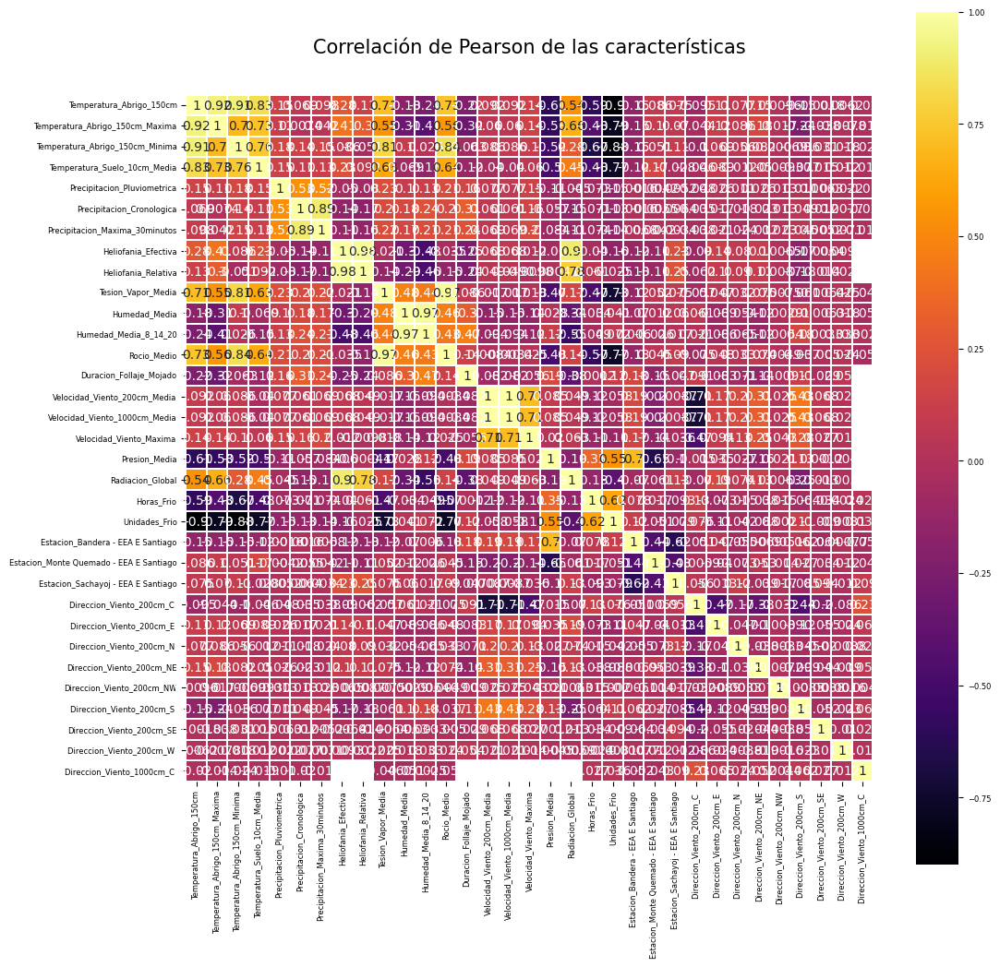

In [ ]:
# Veamos si hay correlaciones lineales o multicolinealidades
colormap = plt.cm.inferno   # mapa de colores
plt.figure(figsize = (12,12))
plt.title('Correlación de Pearson de las características', y = 1.05, size = 15)
sns.heatmap(solar.loc[:, solar.columns != 'Fecha'].corr(method='pearson'), linewidths = 0.1, vmax = 1.0, square = True,
            cmap = colormap,linecolor = 'white', annot = True)
plt.show()

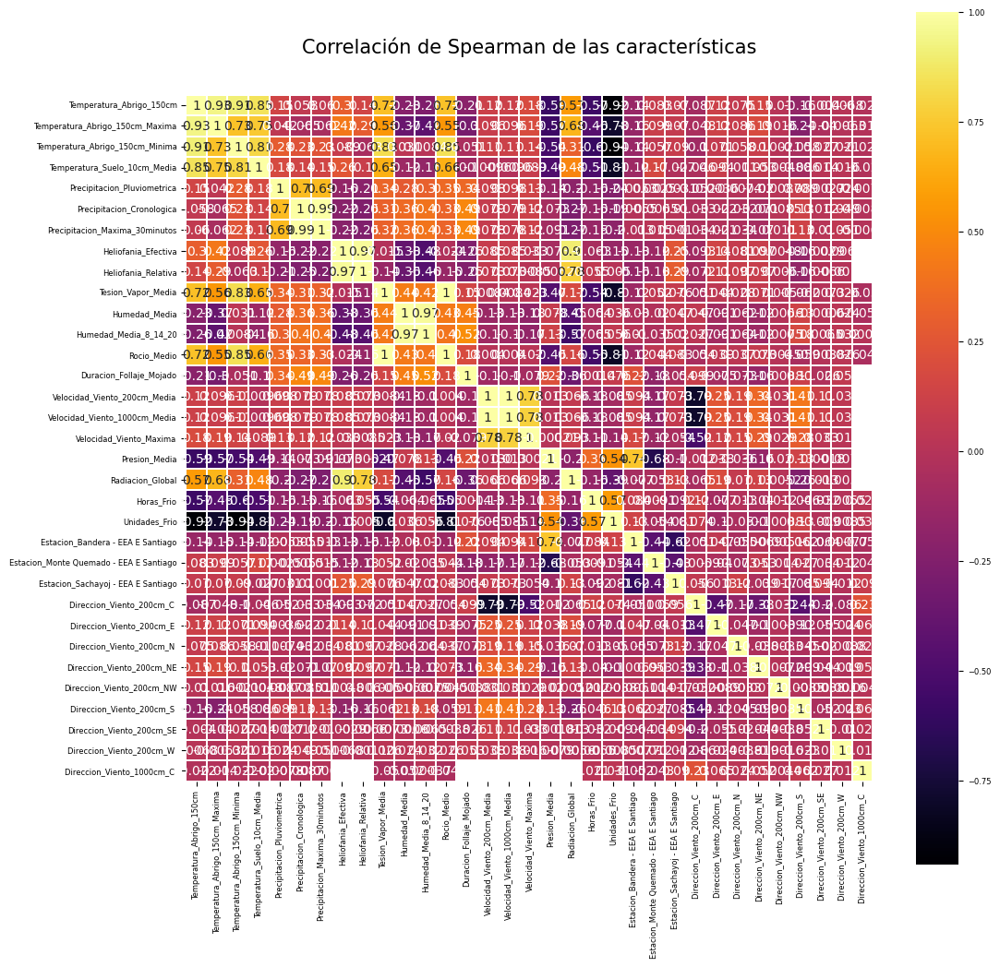

In [ ]:
# Veamos si hay correlaciones no solamente lineales
colormap = plt.cm.inferno   # mapa de colores
plt.figure(figsize = (12,12))
plt.title('Correlación de Spearman de las características', y = 1.05, size = 15)
sns.heatmap(solar.loc[:, solar.columns != 'Fecha'].corr(method='spearman'), linewidths = 0.1, vmax = 1.0, square = True,
            cmap = colormap,linecolor = 'white', annot = True)
plt.show()

Estos gráficos de correlaciones muestran multicolinealidad entre varias características, aquellas cuyos valores de correlación se acercan a 1 ó -1. Dichas variables no deberían ser agregadas todas juntas al modelo de regresión.

* Por ejemplo: no agregar 'Temperatura_Abrigo_150cm', 'Temperatura_Abrigo_150cm_Minima', 'Temperatura_Abrigo_150cm_Maxima' y 'Temperatura_Suelo_10cm_Media' (corr cercana a 1) y 'Unidades_Frio' (corr cercana a -1), sino solamente 'Temperatura_Abrigo_150cm'.
* Se ve una marcada relación de 'Radiacion_Global' con 'Heliofania_Efectiva' y 'Heliofania_Relativa', un poco menos marcada con 'Temperatura_Abrigo_150cm' y 'Temperatura_Abrigo_150cm_Maxima'.
* Se aprecia una relación inversa (corr cerca de -1) entre 'Unidades_Frio' y 'Tesion_Vapor_Media', 'Rocio_Medio' y todas las 'Temperatura...'.
* Se aprecia colinealidad entre: 'Tesion_Vapor_Media'y 'Rocio_Medio' (corr=1).
* Igualmente entre sí las distintas 'Velocidad_Viento...' (corr cerca 1)
* 'Humedad_Media' y 'Humedad_Media_8_14_20' (corr cerca de 1)
* 'Direccion_Viento_C' con 'Velocidad_Viento_200cm' y 'Velocidad_Viento_1000cm' (corr cerca de -1)
* 'Precipitacion_Pluviometrica' con 'Precipitacion_Maxima_30min' (corr cerca de 1)
* 'Tesion_Vapor_Media' con las 'Temperaturas...' (corr cerca de 1)



## Regresión lineal

In [32]:
# elegimos variables
data=solar[['Temperatura_Abrigo_150cm','Radiacion_Global']]
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11503 entries, 0 to 11502
Data columns (total 2 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Temperatura_Abrigo_150cm  11157 non-null  float64
 1   Radiacion_Global          7876 non-null   float64
dtypes: float64(2)
memory usage: 179.9 KB


### Preparación de los datos
El modelo de regresión lineal simple no admite datos faltantes, por ello debemos eliminar los registros ausentes del dataframe.

In [33]:
data.dropna(axis=0, inplace=True)
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7815 entries, 1171 to 11502
Data columns (total 2 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Temperatura_Abrigo_150cm  7815 non-null   float64
 1   Radiacion_Global          7815 non-null   float64
dtypes: float64(2)
memory usage: 183.2 KB


In [ ]:
data.reset_index(drop=True, inplace=True) # resetear el índice del dataframe

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7815 entries, 0 to 7814
Data columns (total 2 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Temperatura_Abrigo_150cm  7815 non-null   float64
 1   Radiacion_Global          7815 non-null   float64
dtypes: float64(2)
memory usage: 122.2 KB


### Construcción del modelo de regresión
Se hará la regresión usando statsmodels que provee mucha información estadística sobre el ajuste

In [36]:
import statsmodels.api as sm
# Definir las variables independiente y dependiente para la regresión
X=sm.add_constant(data['Temperatura_Abrigo_150cm'])
y=data['Radiacion_Global']


In [37]:
#Instanciar el modelo de Regresión Lineal Simple y entrenar
model=sm.OLS(y,X)
results=model.fit()

In [38]:
# Ver resumen de resultados
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:       Radiacion_Global   R-squared:                       0.294
Model:                            OLS   Adj. R-squared:                  0.294
Method:                 Least Squares   F-statistic:                     3248.
Date:                Thu, 21 Aug 2025   Prob (F-statistic):               0.00
Time:                        08:25:43   Log-Likelihood:                -24982.
No. Observations:                7815   AIC:                         4.997e+04
Df Residuals:                    7813   BIC:                         4.998e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                   

### Pendiente

In [39]:
print("Pendiente: ", results.params[1])


Pendiente:  0.606310760119226


### Ordenada al origen

In [40]:
print("Ordenada: ", results.params[0])

Ordenada:  0.5416758811297628


### Coeficiente de determinación

In [41]:
print("R2: ", results.rsquared) #HORRIBLE!!!

R2:  0.2936727258197671


Este valor de R2 indica que este modelo propuesto "y= A*X + B" solamente explica el 29.37% de la varianza de 'y'.

### Array con los parámetros del modelo

In [42]:
results.params

const                       0.541676
Temperatura_Abrigo_150cm    0.606311
dtype: float64

### Intervalo de confianza de los coeficientes

In [43]:
# Intervalos de confianza para los coeficientes del modelo

intervalos_ci = results.conf_int(alpha=0.05)
intervalos_ci.columns = ['2.5%', '97.5%']
intervalos_ci

,2.5%,97.5%
const,0.069640,1.013711
Temperatura_Abrigo_150cm,0.585458,0.627164


### Análisis de residuos

In [44]:
# Calcular errores (residuos) de las predicciones de los datos X (Temperatura)
prediccion = results.predict(exog=X)
residuos   = prediccion - y

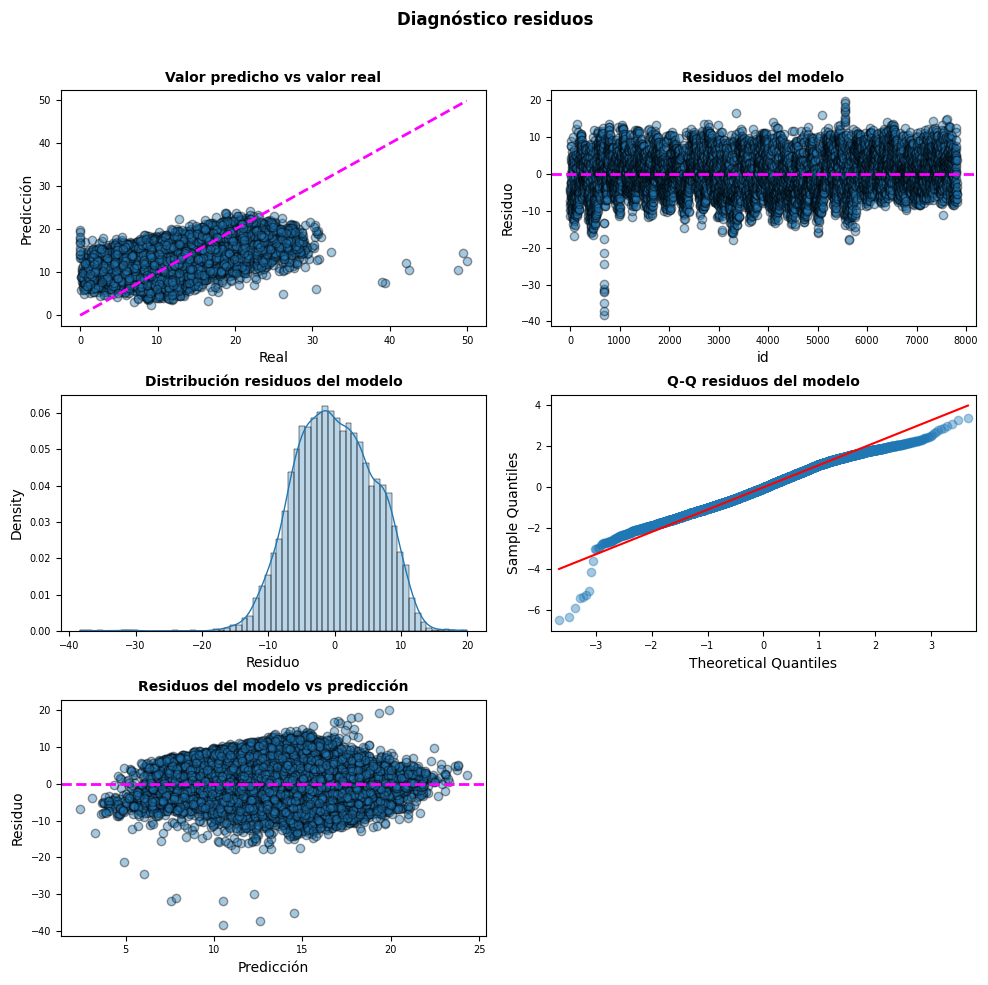

In [ ]:
# Gráficos de Residuos
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(10, 10))

axes[0, 0].scatter(y, prediccion, edgecolors=(0, 0, 0), alpha = 0.4)
axes[0, 0].plot([y.min(), y.max()], [y.min(), y.max()], 'k--', color = 'magenta', lw=2)
axes[0, 0].set_title('Valor predicho vs valor real', fontsize = 10, fontweight = "bold")
axes[0, 0].set_xlabel('Real')
axes[0, 0].set_ylabel('Predicción')
axes[0, 0].tick_params(labelsize = 7)

axes[0, 1].scatter(list(range(len(y))), residuos, edgecolors=(0, 0, 0), alpha = 0.4)
axes[0, 1].axhline(y = 0, linestyle = '--', color = 'magenta', lw=2)
axes[0, 1].set_title('Residuos del modelo', fontsize = 10, fontweight = "bold")
axes[0, 1].set_xlabel('id')
axes[0, 1].set_ylabel('Residuo')
axes[0, 1].tick_params(labelsize = 7)

sns.histplot( data = residuos, stat = "density", kde = True,
             line_kws= {'linewidth': 1}, alpha = 0.3, ax = axes[1, 0])

axes[1, 0].set_title('Distribución residuos del modelo', fontsize = 10, fontweight = "bold")
axes[1, 0].set_xlabel("Residuo")
axes[1, 0].tick_params(labelsize = 7)

sm.qqplot(residuos, fit = True, line = 'q', ax = axes[1, 1], alpha = 0.4, lw = 2)

axes[1, 1].set_title('Q-Q residuos del modelo', fontsize = 10, fontweight = "bold")
axes[1, 1].tick_params(labelsize = 7)

axes[2, 0].scatter(prediccion, residuos, edgecolors=(0, 0, 0), alpha = 0.4)
axes[2, 0].axhline(y = 0, linestyle = '--', color = 'magenta', lw=2)
axes[2, 0].set_title('Residuos del modelo vs predicción', fontsize = 10, fontweight = "bold")
axes[2, 0].set_xlabel('Predicción')
axes[2, 0].set_ylabel('Residuo')
axes[2, 0].tick_params(labelsize = 7)

# Se eliminan los axes vacíos
fig.delaxes(axes[2, 1])
fig.tight_layout()
plt.subplots_adjust(top=0.9)
fig.suptitle('Diagnóstico residuos', fontsize = 12, fontweight = "bold");

De la observación de la distribución de los residuos, vemos que no se distribuyen de manera aleatoria en torno de cero a lo largo del eje X. Esto sugiere que **el modelo no es válido**, tal como está planteado.

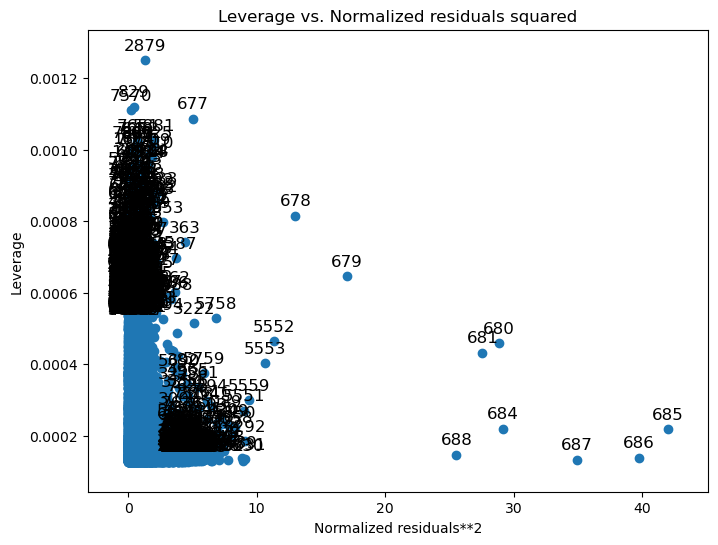

In [45]:
from statsmodels.graphics.regressionplots import plot_leverage_resid2

fig, ax = plt.subplots(figsize=(8, 6))
fig = plot_leverage_resid2(results, ax=ax)

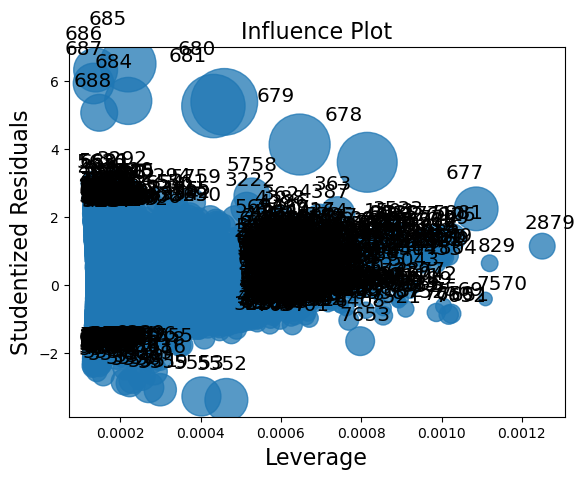

In [46]:
# PLot Cook's distance plot
sm.graphics.influence_plot(results, criterion="cooks")
plt.show()

###Este útimo gráfico señala que las observaciones que se apartan de la mayoría en torno de cero (los círculos más grandes) tienen una mayor influencia en el cálculo de los coeficientes del modelo de regresión lineal simple.

### Test de hipótesis sobre la pendiente
Vamos a plantear las hipótesis (results.params[1] es la pendiente que calcula la regresión lineal):


*   H0: pendiente=0 - Hipótesis nula
*   H1: pendiente!=0 - Hipótesis alternativa

Bajo la suposición de que los errores tienen una distribución normal, el estadístico de prueba será:

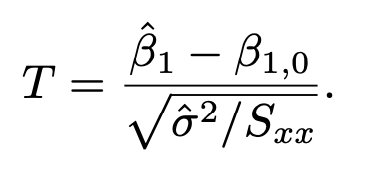

con:

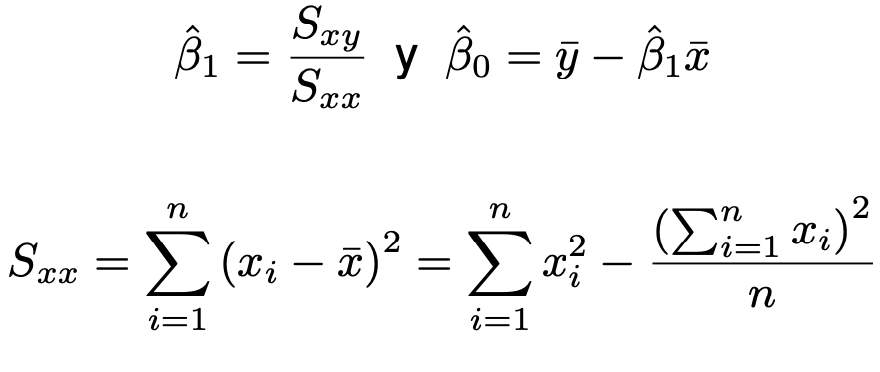

El estadístico T tendrá una distribución 't' de Student con n-2 grados de libertad (n=7815).



En el summary que produce statsmodels aparecen los resultados de los estadísticos para cada coeficiente y su correspondiente p-value.

In [47]:
# Sólo para la pendiente
print(f'Estadístico T = {results.tvalues[1]}')
print(f'p-value = {results.pvalues[1]}')


Estadístico T = 56.99512770280243
p-value = 0.0


### Conclusiones de la regresión lineal

Podemos rechazar la H0 dentro de un intervalo de confianza del 99% (el p-value es mucho menor que 0.01).

Como conclusión del análisis sobre la regresión lineal simple propuesta como ajuste para la 'Radiación_Global' con la 'Temperatura_Abrigo_150cm' como variable independiente, podemos decir que:
*   el modelo luce incompleto (hay que agregar más variables independientes) pues el valor de R2 indica que 'Temperatura_Abrigo_150cm' explica menos del 30% de la varianza de 'Radiación_Global'
*   los residuos no muestran una distribución normal (como muestra el gráfico de QQplot)
*   parece haber una buena cantidad de valores atípicos que se apartan de la relación lineal






## Modelar la Radiación Global con dos modelos de Aprendizaje Automático
### Datos faltantes
Primero hay que revisar los valores faltantes en todas las características, pues los algoritmos de ML en general no toleran manejar datos ausentes.

In [48]:
# Consultamos cuántos valores ausentes hay en cada columna
info=solar.isna().sum()
info.sort_values(ascending=False)

Presion_Media                              5024
Heliofania_Relativa                        4696
Heliofania_Efectiva                        4693
Radiacion_Global                           3627
Velocidad_Viento_1000cm_Media              3261
Velocidad_Viento_200cm_Media               3261
Velocidad_Viento_Maxima                    3202
Duracion_Follaje_Mojado                    3133
Rocio_Medio                                 930
Precipitacion_Maxima_30minutos              880
Tesion_Vapor_Media                          569
Precipitacion_Cronologica                   510
Horas_Frio                                  485
Precipitacion_Pluviometrica                 469
Unidades_Frio                               453
Humedad_Media_8_14_20                       452
Temperatura_Abrigo_150cm_Maxima             354
Temperatura_Abrigo_150cm                    346
Temperatura_Suelo_10cm_Media                344
Humedad_Media                               335
Temperatura_Abrigo_150cm_Minima         

In [49]:
# Cambiamos el tipo de 'Fecha' a datetime
solar['Fecha']=pd.to_datetime(solar['Fecha'])
solar.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11503 entries, 0 to 11502
Data columns (total 34 columns):
 #   Column                                   Non-Null Count  Dtype         
---  ------                                   --------------  -----         
 0   Fecha                                    11503 non-null  datetime64[ns]
 1   Temperatura_Abrigo_150cm                 11157 non-null  float64       
 2   Temperatura_Abrigo_150cm_Maxima          11149 non-null  float64       
 3   Temperatura_Abrigo_150cm_Minima          11181 non-null  float64       
 4   Temperatura_Suelo_10cm_Media             11159 non-null  float64       
 5   Precipitacion_Pluviometrica              11034 non-null  float64       
 6   Precipitacion_Cronologica                10993 non-null  float64       
 7   Precipitacion_Maxima_30minutos           10623 non-null  float64       
 8   Heliofania_Efectiva                      6810 non-null   float64       
 9   Heliofania_Relativa                    

Hacemos gráficos de cada variable vs tiempo para observar si hay valores posiblemente erróneos y el tipo de comportamiento de la variable.

In [50]:
columnas=list(solar.columns)

<Figure size 1000x2000 with 0 Axes>

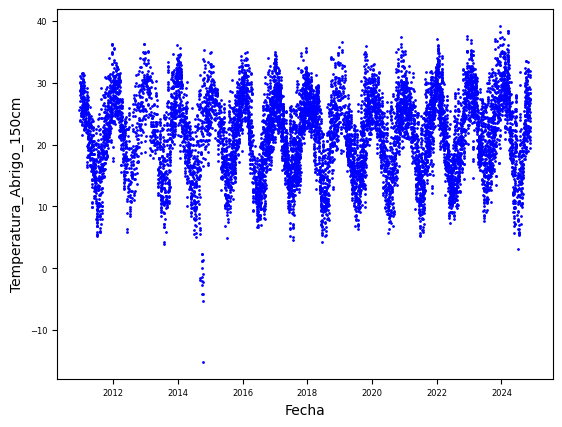

<Figure size 1000x2000 with 0 Axes>

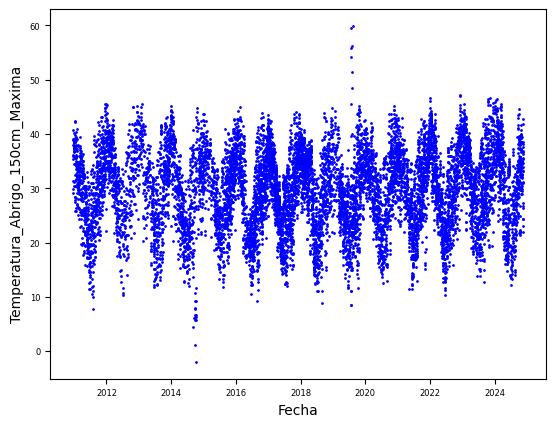

<Figure size 1000x2000 with 0 Axes>

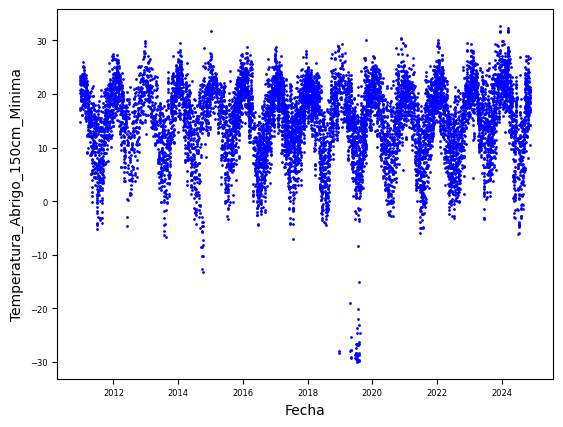

<Figure size 1000x2000 with 0 Axes>

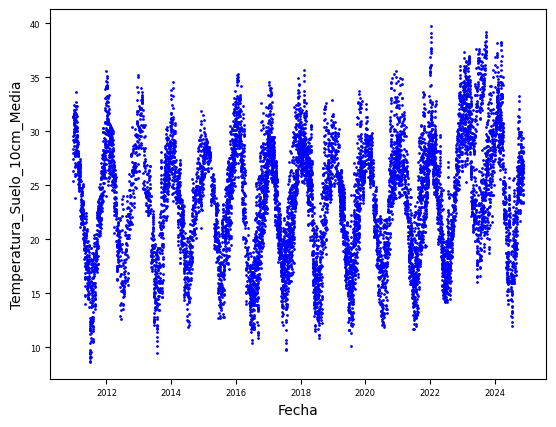

<Figure size 1000x2000 with 0 Axes>

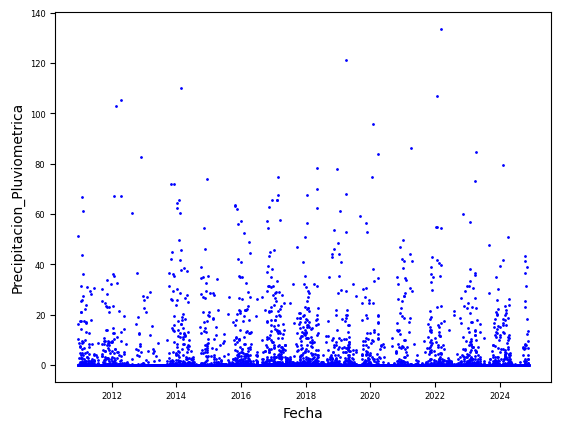

<Figure size 1000x2000 with 0 Axes>

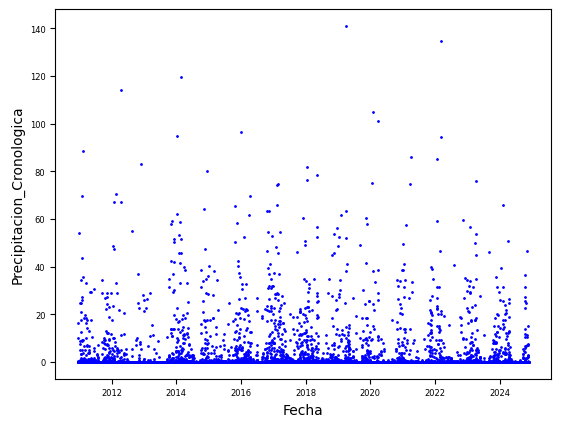

<Figure size 1000x2000 with 0 Axes>

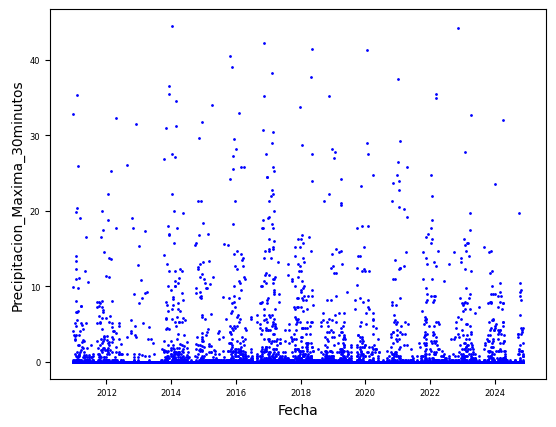

<Figure size 1000x2000 with 0 Axes>

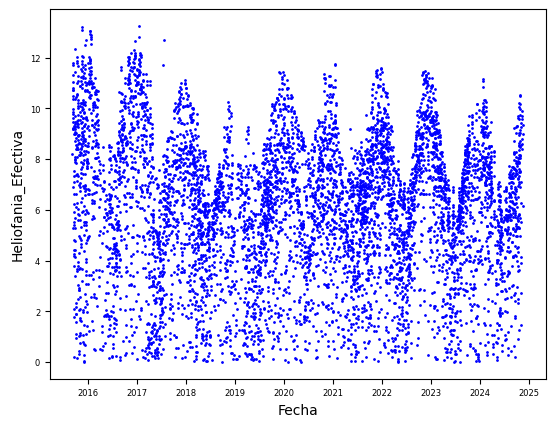

<Figure size 1000x2000 with 0 Axes>

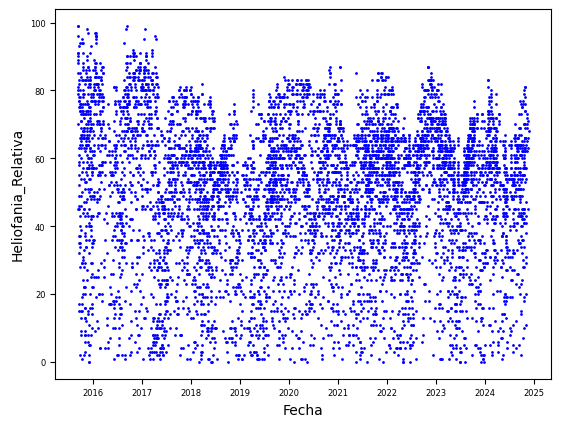

<Figure size 1000x2000 with 0 Axes>

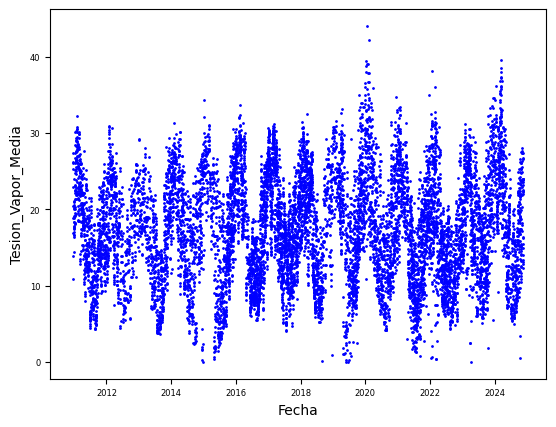

<Figure size 1000x2000 with 0 Axes>

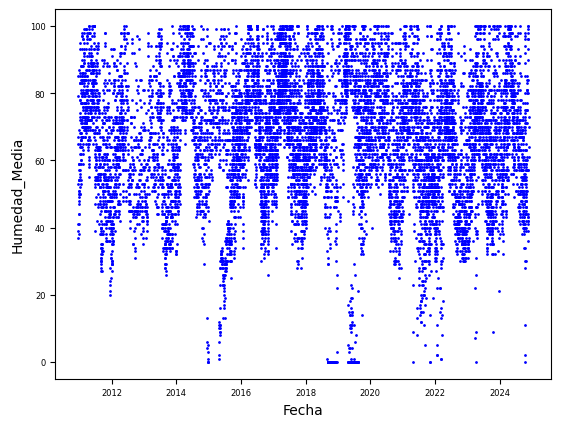

<Figure size 1000x2000 with 0 Axes>

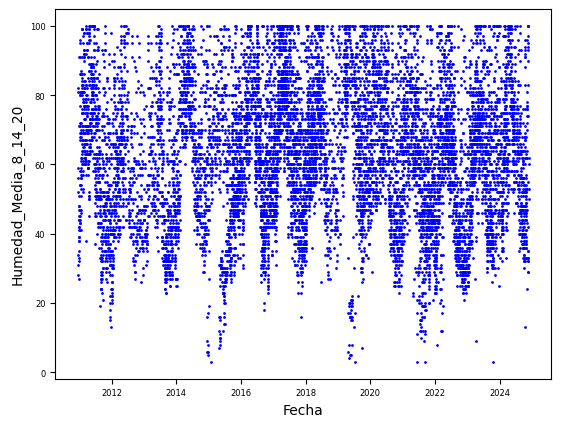

<Figure size 1000x2000 with 0 Axes>

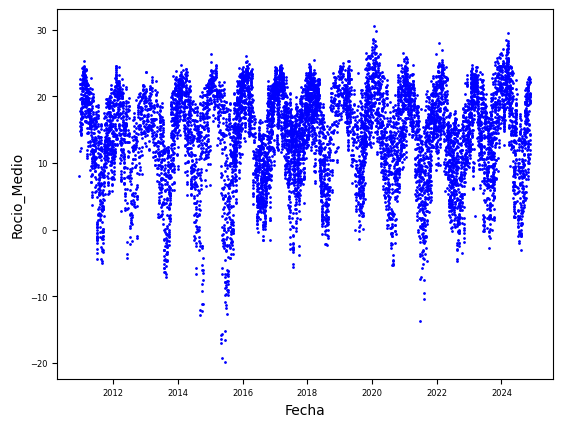

<Figure size 1000x2000 with 0 Axes>

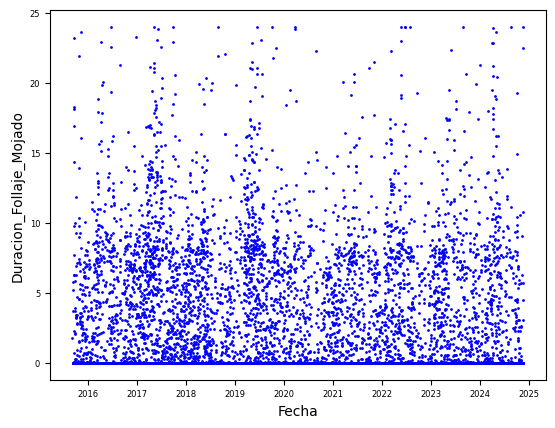

<Figure size 1000x2000 with 0 Axes>

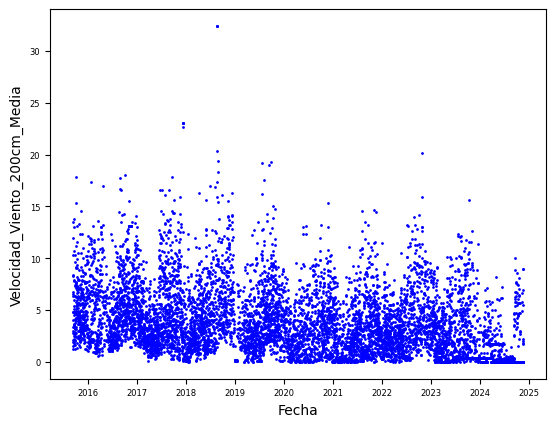

<Figure size 1000x2000 with 0 Axes>

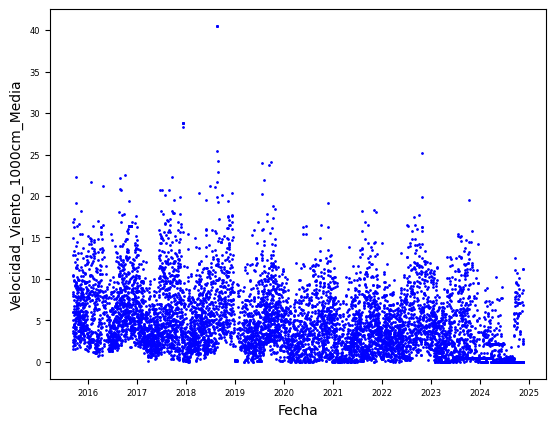

<Figure size 1000x2000 with 0 Axes>

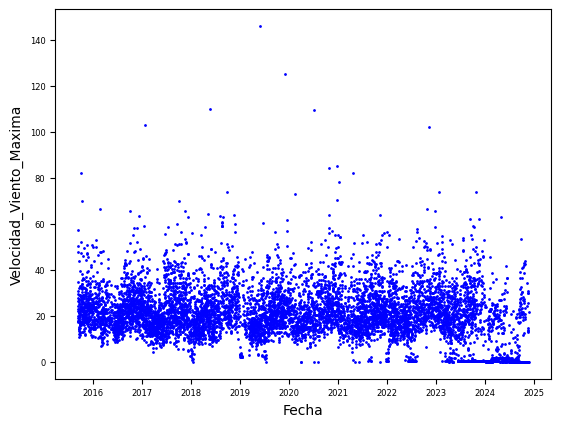

<Figure size 1000x2000 with 0 Axes>

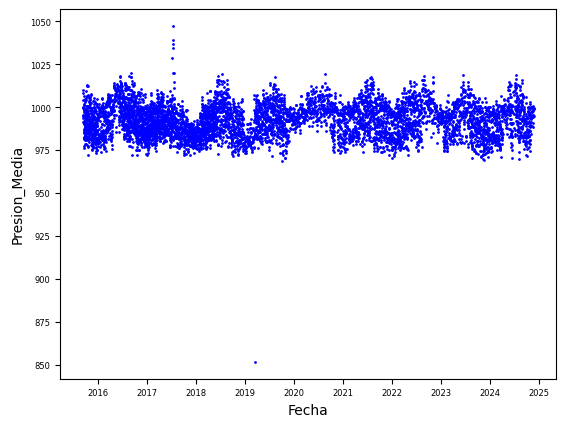

<Figure size 1000x2000 with 0 Axes>

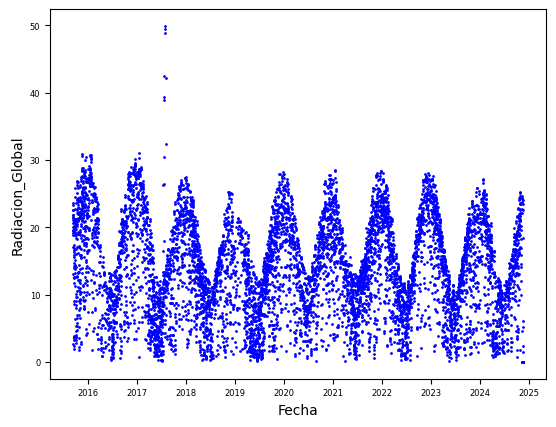

<Figure size 1000x2000 with 0 Axes>

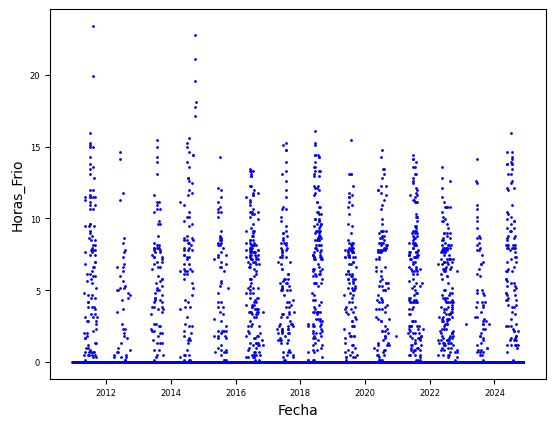

<Figure size 1000x2000 with 0 Axes>

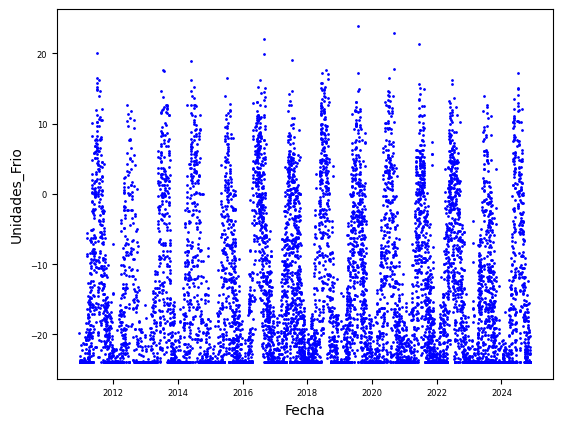

In [ ]:
for col in columnas[1:22]:
    plt.figure(figsize=(10,20))
    ax1 = solar.plot.scatter(x='Fecha',y=col, c='Blue', s=1)
    plt.show()

Los gráficos anteriores muestran que hay algunas observaciones que salen de los valores típicos observados dentro de su característica (por ej: Radiacion_Global por encima de 35, Presion_Media por encima de 1025, Rocio_Medio por debajo de -15, quizás Temperatura_Suelo mayor que 35, Temperatura_Abrigo_150cm_Minima por debajo de -20, Temperatura_Abrigo_150cm_Maxima por fuera del rango de 5 a 50, Temperatura_Abrigo_150cm por debajo de 0).


Sin embargo, sin un conocimiento más profundo del tema bajo análisis no parece apropiado eliminar estos valores del dataset, pues no queda claro si se trata de errores en los aparatos de medición o valores extremos que realmente se midieron.

PREPARACIÓN DE DATOS PARA MODELADO

Si se tomará 'Radiacion_Global' como target de la regresión, hay que separar el dataset en la parte que sí tenga datos de Radiación para desarrollar el modelo. La parte que no los tenga se podría completar con el resultado de la regresión, una vez optimizada.

In [51]:
solar_rad=solar[solar['Radiacion_Global'].notna()] # donde Radiacion no es NaN
solar_rad.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7876 entries, 1171 to 11502
Data columns (total 34 columns):
 #   Column                                   Non-Null Count  Dtype         
---  ------                                   --------------  -----         
 0   Fecha                                    7876 non-null   datetime64[ns]
 1   Temperatura_Abrigo_150cm                 7815 non-null   float64       
 2   Temperatura_Abrigo_150cm_Maxima          7805 non-null   float64       
 3   Temperatura_Abrigo_150cm_Minima          7836 non-null   float64       
 4   Temperatura_Suelo_10cm_Media             7824 non-null   float64       
 5   Precipitacion_Pluviometrica              7659 non-null   float64       
 6   Precipitacion_Cronologica                7691 non-null   float64       
 7   Precipitacion_Maxima_30minutos           7243 non-null   float64       
 8   Heliofania_Efectiva                      6810 non-null   float64       
 9   Heliofania_Relativa                      6

Como todavía existen valores ausentes en algunas características tomaremos el sgte criterio para la imputación:

*   Para las 'Temperaturas...' usaremos **interpolación lineal entre vecinos** (puesto que son variables con un comportamiento más 'suave')
*   Para el resto de las variables, imputaremos la **mediana de la característica** (pues es más robusta frente a valores atípicos y las demás variables tienen un comportamiento más aleatorio).



In [52]:
#Separamos la serie 'Fecha' del resto del dataset
fecha=solar_rad['Fecha']

In [ ]:
#Rellenar Temperaturas
solar_rad['Temperatura_Abrigo_150cm']=solar_rad['Temperatura_Abrigo_150cm'].interpolate(method='nearest')
solar_rad['Temperatura_Abrigo_150cm_Minima']=solar_rad['Temperatura_Abrigo_150cm_Minima'].interpolate(method='nearest')
solar_rad['Temperatura_Abrigo_150cm_Maxima']=solar_rad['Temperatura_Abrigo_150cm_Maxima'].interpolate(method='nearest')
solar_rad['Temperatura_Suelo_10cm_Media']=solar_rad['Temperatura_Suelo_10cm_Media'].interpolate(method='nearest')

# Explicación:
# Este bloque rellena los valores faltantes (NaN) en las columnas de temperatura del DataFrame solar_rad usando interpolación.

# El método 'nearest' busca el valor más cercano (en el eje de los datos) para completar los huecos.
# Se aplica a las columnas de temperatura: abrigo a 150cm (media, mínima, máxima) y suelo a 10cm (media).
# Resultado:
# Las temperaturas faltantes se completan con el valor válido más próximo, suavizando la serie y evitando perder datos por nulos.

In [ ]:
columnas=list(solar.columns)
columnas.remove('Fecha')
print(len(columnas))
columnas

33


['Temperatura_Abrigo_150cm',
 'Temperatura_Abrigo_150cm_Maxima',
 'Temperatura_Abrigo_150cm_Minima',
 'Temperatura_Suelo_10cm_Media',
 'Precipitacion_Pluviometrica',
 'Precipitacion_Cronologica',
 'Precipitacion_Maxima_30minutos',
 'Heliofania_Efectiva',
 'Heliofania_Relativa',
 'Tesion_Vapor_Media',
 'Humedad_Media',
 'Humedad_Media_8_14_20',
 'Rocio_Medio',
 'Duracion_Follaje_Mojado',
 'Velocidad_Viento_200cm_Media',
 'Velocidad_Viento_1000cm_Media',
 'Velocidad_Viento_Maxima',
 'Presion_Media',
 'Radiacion_Global',
 'Horas_Frio',
 'Unidades_Frio',
 'Estacion_Bandera - EEA E Santiago',
 'Estacion_Monte Quemado - EEA E Santiago',
 'Estacion_Sachayoj - EEA E Santiago',
 'Direccion_Viento_200cm_C ',
 'Direccion_Viento_200cm_E ',
 'Direccion_Viento_200cm_N ',
 'Direccion_Viento_200cm_NE',
 'Direccion_Viento_200cm_NW',
 'Direccion_Viento_200cm_S ',
 'Direccion_Viento_200cm_SE',
 'Direccion_Viento_200cm_W ',
 'Direccion_Viento_1000cm_C ']

In [ ]:
solar_rad.shape

(7876, 34)

In [ ]:
fecha.shape

(7876,)

In [ ]:
fecha.reset_index(drop=True, inplace=True)
fecha

0      2015-09-09
1      2015-09-10
2      2015-09-11
3      2015-09-12
4      2015-09-13
          ...    
7871   2024-10-25
7872   2024-10-26
7873   2024-10-27
7874   2024-10-28
7875   2024-10-29
Name: Fecha, Length: 7876, dtype: datetime64[ns]

In [ ]:
# Imputar el resto de las características con la mediana
from sklearn.impute import SimpleImputer

imput=SimpleImputer(missing_values= np.nan, strategy= 'median') #Instanciar transformador
solar_rad=imput.fit_transform(solar_rad.loc[:, solar_rad.columns != 'Fecha'].values) # entrenar y transformar
# el SimpleImputer devuelve un np.array
solar_rad=pd.DataFrame(solar_rad, columns=columnas)
solar_rad.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7876 entries, 0 to 7875
Data columns (total 33 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   Temperatura_Abrigo_150cm                 7876 non-null   float64
 1   Temperatura_Abrigo_150cm_Maxima          7876 non-null   float64
 2   Temperatura_Abrigo_150cm_Minima          7876 non-null   float64
 3   Temperatura_Suelo_10cm_Media             7876 non-null   float64
 4   Precipitacion_Pluviometrica              7876 non-null   float64
 5   Precipitacion_Cronologica                7876 non-null   float64
 6   Precipitacion_Maxima_30minutos           7876 non-null   float64
 7   Heliofania_Efectiva                      7876 non-null   float64
 8   Heliofania_Relativa                      7876 non-null   float64
 9   Tesion_Vapor_Media                       7876 non-null   float64
 10  Humedad_Media                            7876 no

In [ ]:
solar_rad_fecha=solar_rad.copy()
solar_rad_fecha['Fecha']=fecha
solar_rad_fecha['Fecha']=pd.to_datetime(solar_rad_fecha['Fecha'])
solar_rad_fecha.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7876 entries, 0 to 7875
Data columns (total 34 columns):
 #   Column                                   Non-Null Count  Dtype         
---  ------                                   --------------  -----         
 0   Temperatura_Abrigo_150cm                 7876 non-null   float64       
 1   Temperatura_Abrigo_150cm_Maxima          7876 non-null   float64       
 2   Temperatura_Abrigo_150cm_Minima          7876 non-null   float64       
 3   Temperatura_Suelo_10cm_Media             7876 non-null   float64       
 4   Precipitacion_Pluviometrica              7876 non-null   float64       
 5   Precipitacion_Cronologica                7876 non-null   float64       
 6   Precipitacion_Maxima_30minutos           7876 non-null   float64       
 7   Heliofania_Efectiva                      7876 non-null   float64       
 8   Heliofania_Relativa                      7876 non-null   float64       
 9   Tesion_Vapor_Media                       

<Figure size 1000x2000 with 0 Axes>

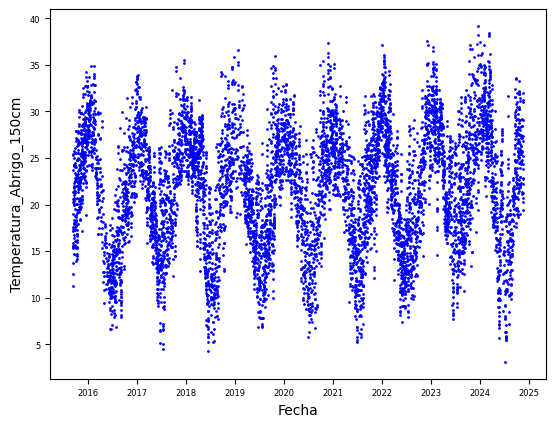

<Figure size 1000x2000 with 0 Axes>

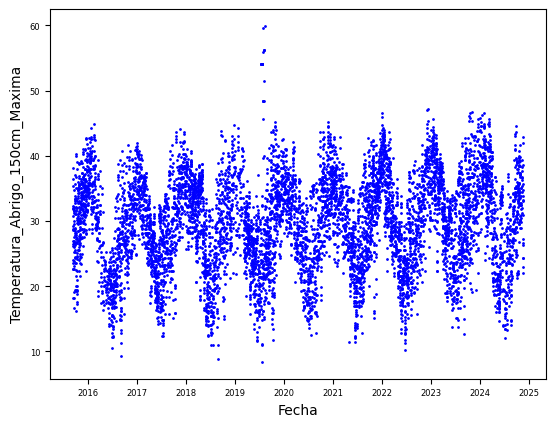

<Figure size 1000x2000 with 0 Axes>

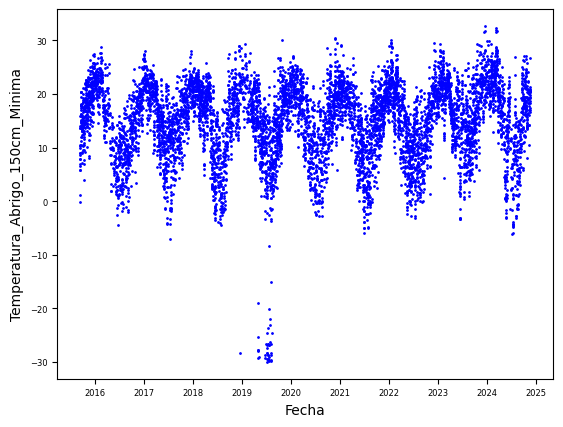

<Figure size 1000x2000 with 0 Axes>

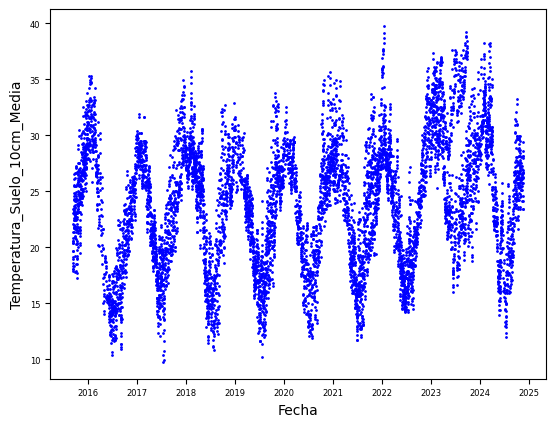

<Figure size 1000x2000 with 0 Axes>

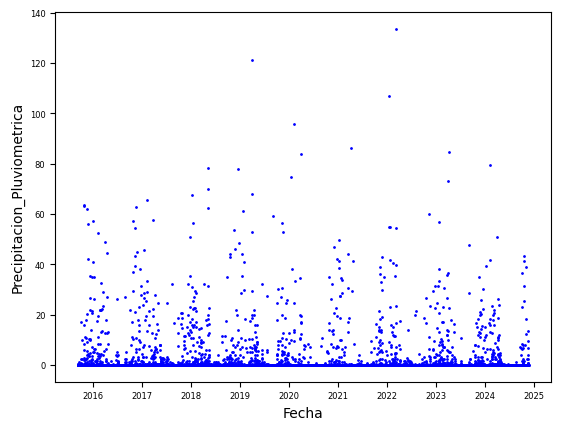

<Figure size 1000x2000 with 0 Axes>

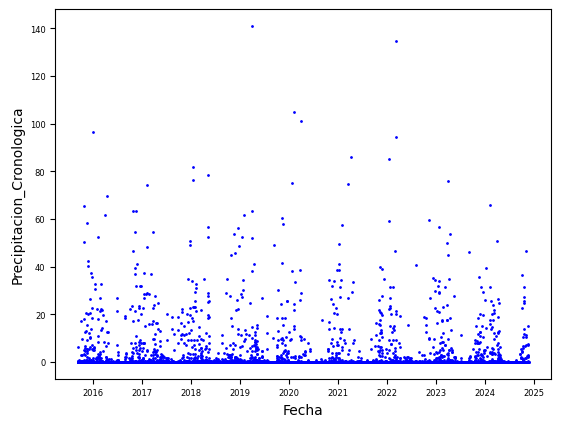

<Figure size 1000x2000 with 0 Axes>

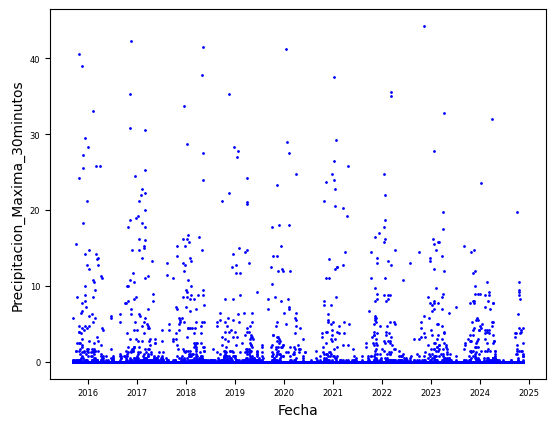

<Figure size 1000x2000 with 0 Axes>

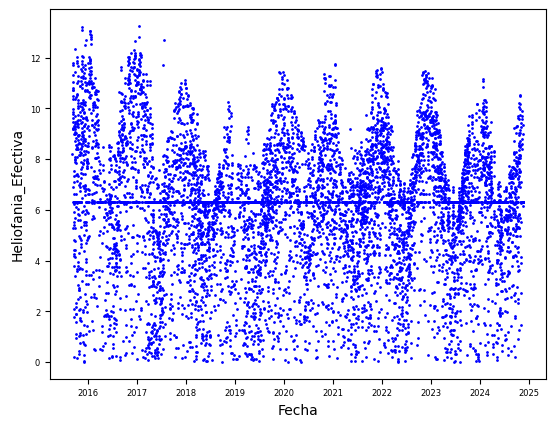

<Figure size 1000x2000 with 0 Axes>

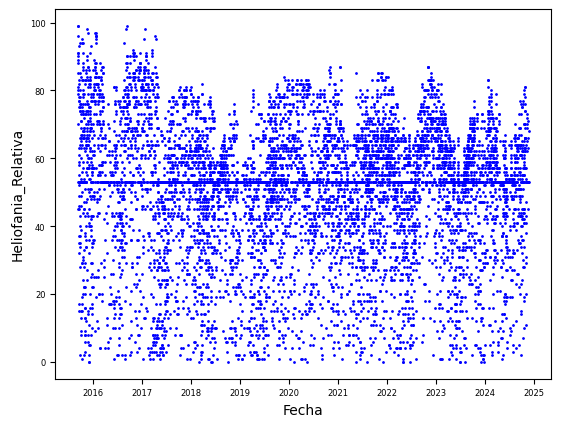

<Figure size 1000x2000 with 0 Axes>

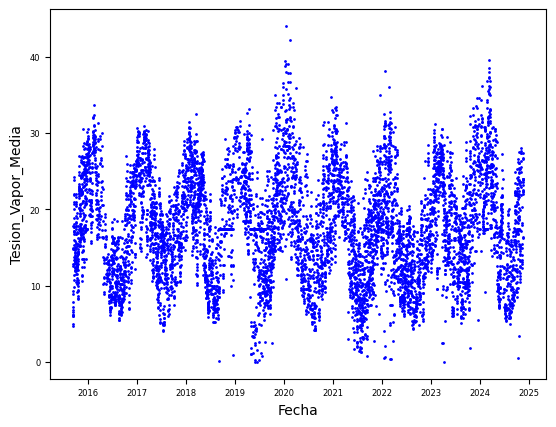

<Figure size 1000x2000 with 0 Axes>

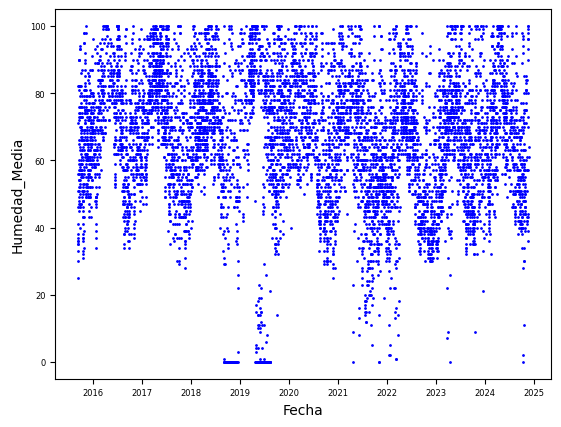

<Figure size 1000x2000 with 0 Axes>

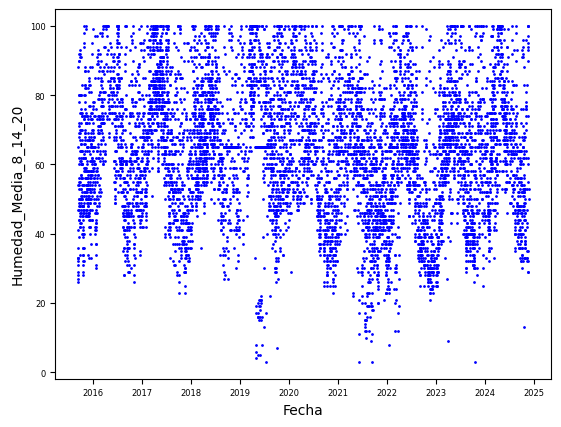

<Figure size 1000x2000 with 0 Axes>

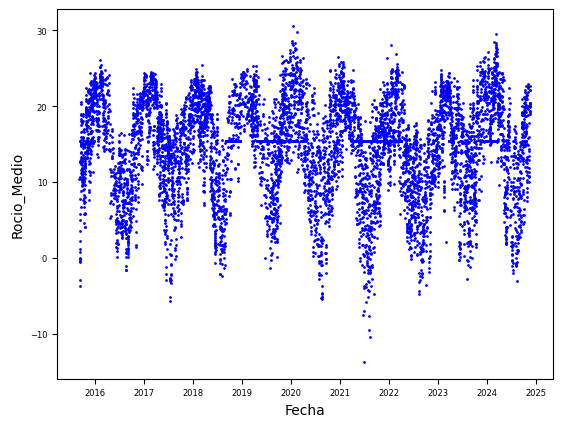

<Figure size 1000x2000 with 0 Axes>

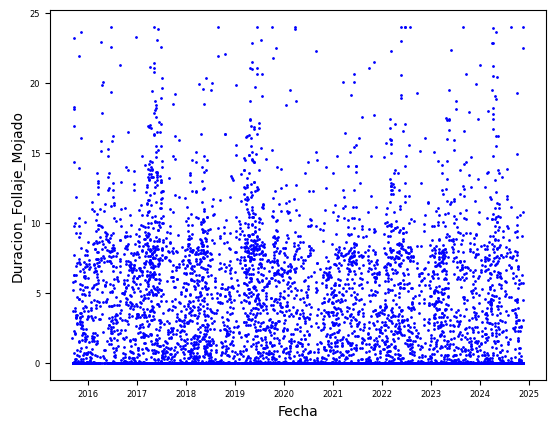

<Figure size 1000x2000 with 0 Axes>

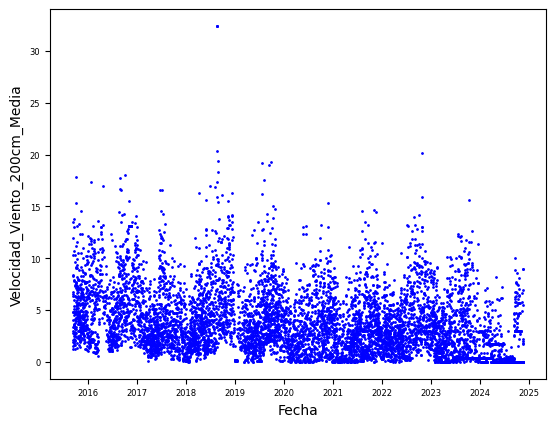

<Figure size 1000x2000 with 0 Axes>

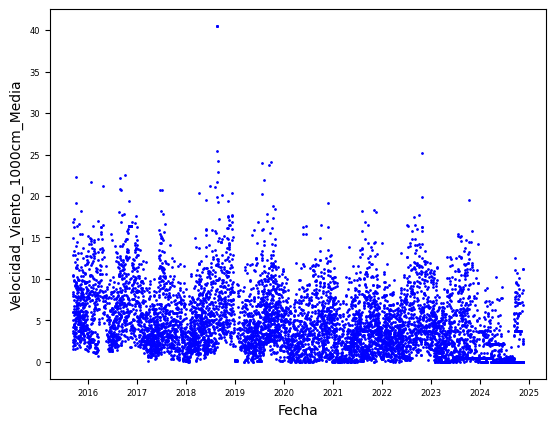

<Figure size 1000x2000 with 0 Axes>

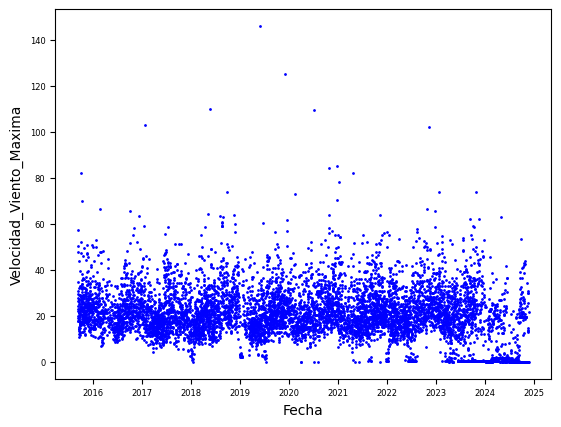

<Figure size 1000x2000 with 0 Axes>

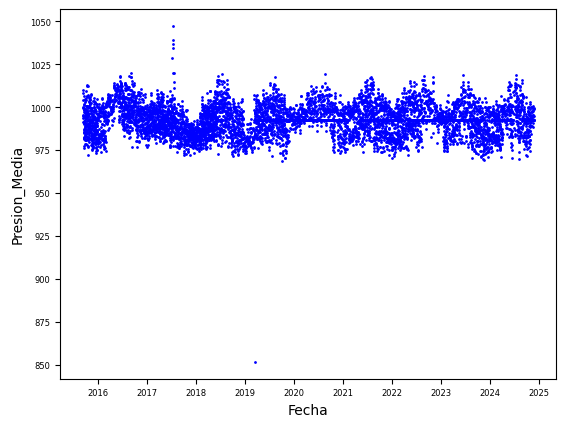

<Figure size 1000x2000 with 0 Axes>

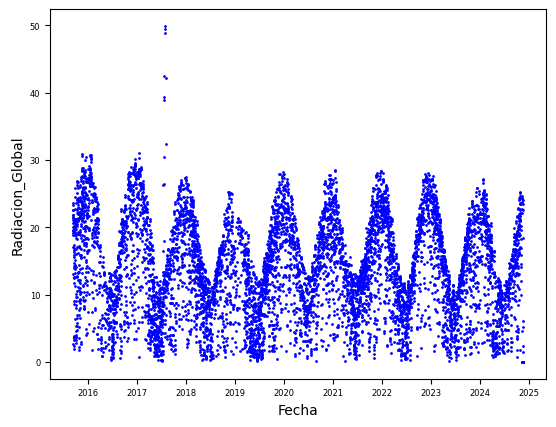

<Figure size 1000x2000 with 0 Axes>

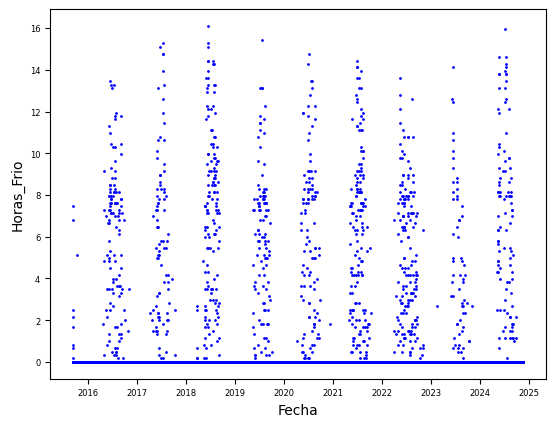

<Figure size 1000x2000 with 0 Axes>

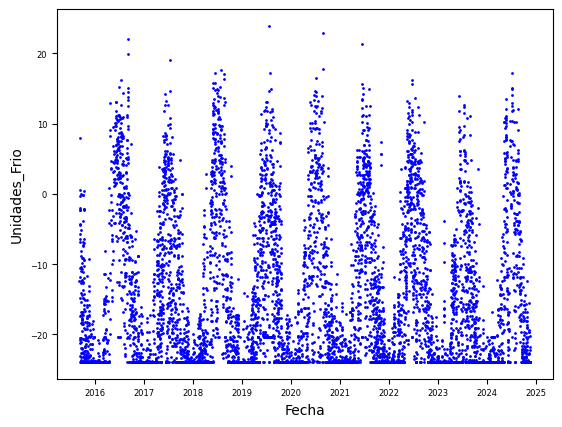

In [ ]:
for col in columnas[:21]:
    plt.figure(figsize=(10,20))
    ax1 = solar_rad_fecha.plot.scatter(x='Fecha',y=col, c='Blue', s=1)
    plt.show()

El dataset está completado y se puede empezar a modelar la regresión con dos algoritmos distintos.
### Aplicación de modelos

Elegimos:
*   Máquina de soporte vectorial (SVR) como regresor
*   XGBoost como regresor



Separamos el dataset en conjunto de entrenamiento y conjunto de testeo para verificar la performance del modelo elegido.

In [ ]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.svm import SVR
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score
import warnings

warnings.filterwarnings('ignore')

# Definir variables independientes y dependiente
y = solar_rad['Radiacion_Global']
X = solar_rad.drop(columns=['Radiacion_Global'])

# El conjunto de testeo tendrá un 20% de la cantidad total de observaciones disponibles
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

### Modelo SVR

In [ ]:
# Creamos un pipeline con el transformador Standard Scaler, el seleccionador de características
#  y el estimador que hará la regresión
# Para seleccionar características se usará el criterio 'f_regression' que es apropiado para variables continuas
# Definimos la grilla de parámetros que usaremos para optimizar los parámetros
# Seleccionamos solamente dos kernel y dos parámetros para optimizar SVR
# por el tiempo que necesitan para hacer la búsqueda (intentamos con más parámetros
# y tardaba varias horas)

pipeline_svr = make_pipeline(StandardScaler(), SelectKBest(f_regression), SVR())
param_grid_svr = [{ 'selectkbest__k' : list(range(1, 32)),
                   'svr__C': [0.01, 0.1, 1, 10, 100],
                   'svr__kernel': ['linear'] },
                    { 'selectkbest__k' : list(range(1, 32)),
                   'svr__C': [0.01, 0.1, 1, 10, 100],
                   'svr__gamma': [0.1, 1, 10],
                   'svr__kernel': ['rbf'] }]

# Instanciamos una Búsqueda por Cuadrículas, usando como 'score' a observar R2
# y con validación cruzada de 5 carpetas (aunque cv=10 es lo recomendado por literatura, otra vez tiempo...)
grid_search_svr = GridSearchCV(pipeline_svr, param_grid_svr, cv=5, scoring='r2', verbose=2, n_jobs=-1)


In [ ]:
# Entrenamos optimizador: en una PC con procesador I7 y 32 gb de RAM, demoró casi 163 minutos
grid_search_svr.fit(X_train, y_train)


Fitting 5 folds for each of 620 candidates, totalling 3100 fits
[CV] END ..selectkbest__k=1, svr__C=0.01, svr__kernel=linear; total time=   2.2s
[CV] END ..selectkbest__k=1, svr__C=0.01, svr__kernel=linear; total time=   2.2s
[CV] END ..selectkbest__k=1, svr__C=0.01, svr__kernel=linear; total time=   2.2s
[CV] END ..selectkbest__k=1, svr__C=0.01, svr__kernel=linear; total time=   2.2s
[CV] END ...selectkbest__k=1, svr__C=0.1, svr__kernel=linear; total time=   2.2s
[CV] END ...selectkbest__k=1, svr__C=0.1, svr__kernel=linear; total time=   2.2s
[CV] END ...selectkbest__k=1, svr__C=0.1, svr__kernel=linear; total time=   2.2s
[CV] END ..selectkbest__k=1, svr__C=0.01, svr__kernel=linear; total time=   2.2s
[CV] END ...selectkbest__k=1, svr__C=0.1, svr__kernel=linear; total time=   2.2s
[CV] END ...selectkbest__k=1, svr__C=0.1, svr__kernel=linear; total time=   2.2s
[CV] END .....selectkbest__k=1, svr__C=1, svr__kernel=linear; total time=   2.2s
[CV] END .....selectkbest__k=1, svr__C=1, svr

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('standardscaler', StandardScaler()),
                                       ('selectkbest',
                                        SelectKBest(score_func=<function f_regression at 0x14399e2a0>)),
                                       ('svr', SVR())]),
             n_jobs=-1,
             param_grid=[{'selectkbest__k': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11,
                                             12, 13, 14, 15, 16, 17, 18, 19, 20,
                                             21, 22, 23, 24, 25, 26, 27, 28, 29,
                                             30, ...],
                          'svr__C': [0.01, 0.1, 1, 10, 100],
                          'svr__kernel': ['linear']},
                         {'selectkbest__k': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11,
                                             12, 13, 14, 15, 16, 17, 18, 19, 20,
                                             21, 22, 23, 24, 25, 26, 27, 28, 29,
                                             30, ...],
                          'svr__C': [0.01, 0.1, 1, 10, 100],
                          'svr__gamma': [0.1, 1, 10], 'svr__kernel': ['rbf']}],
             scoring='r2', verbose=2)

Métricas de entrenamiento SVR

In [ ]:
# Evaluación de SVR
# Se aplicó validación cruzada de 5 carpetas (k_fold=5) durante el entrenamiento

y_pred_svr = grid_search_svr.best_estimator_.predict(X_train)
mse_svr = mean_squared_error(y_train, y_pred_svr)
r2_svr = r2_score(y_train, y_pred_svr)
print(f"Mejor modelo SVR: {grid_search_svr.best_params_}")
print(f"Mejor R2_Score modelo SVR con validación cruzada: {grid_search_svr.best_score_}")
print(f"Error cuadrático medio SVR: {mse_svr}")
print(f"R2 SVR: {r2_svr}")


Mejor modelo SVR: {'selectkbest__k': 3, 'svr__C': 100, 'svr__gamma': 10, 'svr__kernel': 'rbf'}
Mejor R2_Score modelo SVR con validación cruzada: 0.9223023676431253
Error cuadrático medio SVR: 3.2752375640789526
R2 SVR: 0.9339082375587728


Graficamos predicciones del Mejor Estimador SVR vs los valores reales para el conjunto de testeo X_test

Los pares de puntos que se apartan de la recta y=X son los 'errores' del modelo

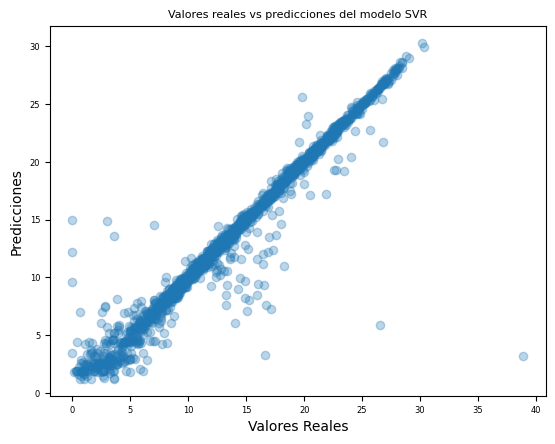

In [ ]:
y_hat_svr=grid_search_svr.best_estimator_.predict(X_test)
plt.scatter(y_test, y_hat_svr, alpha=0.3)
plt.xlabel("Valores Reales")
plt.ylabel("Predicciones")
plt.title("Valores reales vs predicciones del modelo SVR")
plt.show()

Queremos saber cuáles son las características seleccionadas por SelectKBest

In [ ]:
caract=grid_search_svr.best_estimator_.named_steps['selectkbest'].get_support()
car_names=[c* col for c, col in zip(caract, X.columns) if c*col!='' ]

print(f'Mejores Características según SelectKBest : \n{car_names}')

Mejores Características según SelectKBest : 
['Temperatura_Abrigo_150cm_Maxima', 'Heliofania_Efectiva', 'Heliofania_Relativa']


'caract' es una máscara booleana generada por SelectKBest que selecciona las características de entre las presentes en X

Queremos saber los mejores parámetros que optimizan el modelo

In [ ]:
print(f'Mejores parámetros para SVR: \n{grid_search_svr.best_params_}')

Mejores parámetros para SVR: 
{'selectkbest__k': 3, 'svr__C': 100, 'svr__gamma': 10, 'svr__kernel': 'rbf'}


Gráfico de residuos SVR

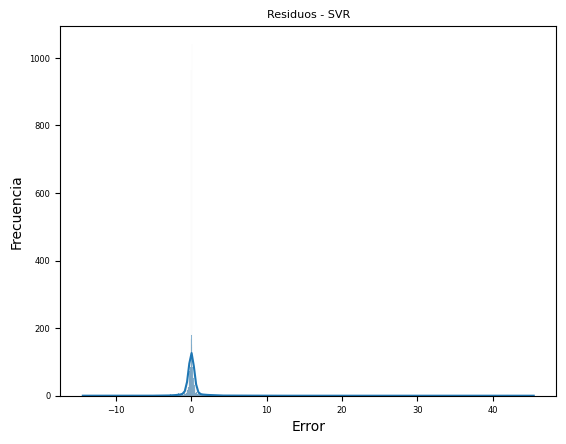

In [ ]:
# Veamos los residuos: distribución en el cjto de entrenamiento
residuos_svr=y_train - y_pred_svr
sns.histplot(residuos_svr, kde=True)
plt.title("Residuos - SVR")
plt.xlabel("Error")
plt.ylabel("Frecuencia")
plt.tight_layout
plt.show()

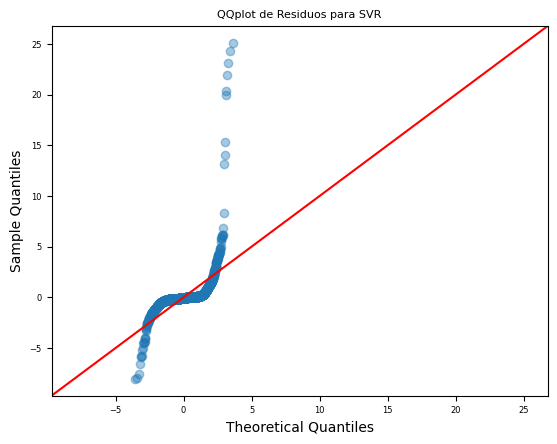

In [ ]:
#QQ Plot de los residuos

sm.qqplot(residuos_svr, fit = True, line = '45', alpha = 0.4, lw = 2)
plt.title('QQplot de Residuos para SVR')
plt.show()

Los residuos no muestran una distribución normal.

Un parámetro más adecuado para determinar la bondad del ajuste es el "R2 ajustado" antes que "R2". Esto se debe a que R2 crecerá en función de cuantos más parámetros tenga el modelo, en tanto que "R2 ajustado" se ajusta según la cantidad de parámetros y la cantidad de observaciones.

Se calcula según la siguiente expresión:

Adjusted-R2 = 1 – [(1-R2)*(n-1)/(n-k-1)]

donde:

* R2: R2 del modelo
* n: número de observaciones
* k: número de variables predictoras del modelo

In [ ]:
# Definimos una función que calcula R2 ajustado
def adj_r2(r2, n, k):
    return 1 - (1 - r2)*(n-1)/(n-k-1)

print(f'R2 ajustado SVR = {adj_r2(grid_search_svr.best_score_, X_train.shape[0], len(car_names))}')

R2 ajustado SVR = 0.9222653452643021


RESUMEN DE LOS RESULTADOS DE SVR CON VALIDACIÓN CRUZADA Y SELECCIÓN DE CARACTERÍSTICAS

* El mejor modelo seleccionado usa C=100, gamma=10 y kernel='rbf' con 3 variables seleccionadas.
* Las variables elegidas fueron: 'Temperatura_Abrigo_150cm_Maxima', 'Heliofania_Efectiva', 'Heliofania_Relativa'
* Los residuos no muestran distribución normal.
* El error cuadrático medio (MSE) es 3.275 indicando cierto nivel de error en las predicciones.
* El coeficiente de determinación ajustado (adjust-R²) es 0.9223: el modelo explica el 92.23% de la variabilidad de los datos.
* El tiempo de procesamiento superó 1 hora (en una PC con i7 y 32 GB de RAM)

### Modelo XGBOOST

In [ ]:
#  Instanciamos un modelo XGBoost dentro de un pipeline, sin selector de características,
# pero con búsqueda de cuadrículas para una rango de 3 parámetros relevantes

# Pipeline
pipeline_xgb = make_pipeline(StandardScaler(), GradientBoostingRegressor())
param_grid_xgb = {
    'gradientboostingregressor__n_estimators': [100, 200, 300], # núm de árboles
    'gradientboostingregressor__learning_rate': [0.01, 0.1, 0.2], # tasa de aprendizaje del Descenso del Gradiente
    'gradientboostingregressor__max_depth': [3, 5, 7, 10, 'None'] # máxima profundidad de los árboles de decisión
}

# Optimizador con validación cruzada de 5 carpetas, usando como Score el R2
grid_search_xgb = GridSearchCV(pipeline_xgb, param_grid_xgb, cv=5, scoring='r2', verbose=2, n_jobs=-1)

# Entrenamiento del optimizador usando todas las características de X_train
grid_search_xgb.fit(X_train, y_train)


Fitting 5 folds for each of 45 candidates, totalling 225 fits
[CV] END gradientboostingregressor__learning_rate=0.01, gradientboostingregressor__max_depth=3, gradientboostingregressor__n_estimators=100; total time=   2.7s
[CV] END gradientboostingregressor__learning_rate=0.01, gradientboostingregressor__max_depth=3, gradientboostingregressor__n_estimators=100; total time=   2.7s
[CV] END gradientboostingregressor__learning_rate=0.01, gradientboostingregressor__max_depth=3, gradientboostingregressor__n_estimators=100; total time=   2.7s
[CV] END gradientboostingregressor__learning_rate=0.01, gradientboostingregressor__max_depth=3, gradientboostingregressor__n_estimators=100; total time=   2.7s
[CV] END gradientboostingregressor__learning_rate=0.01, gradientboostingregressor__max_depth=3, gradientboostingregressor__n_estimators=100; total time=   2.7s
[CV] END gradientboostingregressor__learning_rate=0.01, gradientboostingregressor__max_depth=3, gradientboostingregressor__n_estimators=20

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('standardscaler', StandardScaler()),
                                       ('gradientboostingregressor',
                                        GradientBoostingRegressor())]),
             n_jobs=-1,
             param_grid={'gradientboostingregressor__learning_rate': [0.01, 0.1,
                                                                      0.2],
                         'gradientboostingregressor__max_depth': [3, 5, 7, 10,
                                                                  'None'],
                         'gradientboostingregressor__n_estimators': [100, 200,
                                                                     300]},
             scoring='r2', verbose=2)

Métricas de entrenamiento XGBoost

In [ ]:
# Evaluación del mejor estimador del Grid Search
y_pred_xgb = grid_search_xgb.best_estimator_.predict(X_train)
mse_xgb = mean_squared_error(y_train, y_pred_xgb)
r2_xgb = r2_score(y_train, y_pred_xgb)
print(f"Mejor modelo XGBoost:\n{grid_search_xgb.best_params_}")
print(f"Error cuadrático medio XGBoost: {mse_xgb}")
print(f"R2 XGBoost: {r2_xgb}")
print(f"R2 XGBoost con validación cruzada: {grid_search_xgb.best_score_}")


Mejor modelo XGBoost:
{'gradientboostingregressor__learning_rate': 0.2, 'gradientboostingregressor__max_depth': 3, 'gradientboostingregressor__n_estimators': 300}
Error cuadrático medio XGBoost: 0.476245130804047
R2 XGBoost: 0.9903897413750676
R2 XGBoost con validación cruzada: 0.9395053379676437


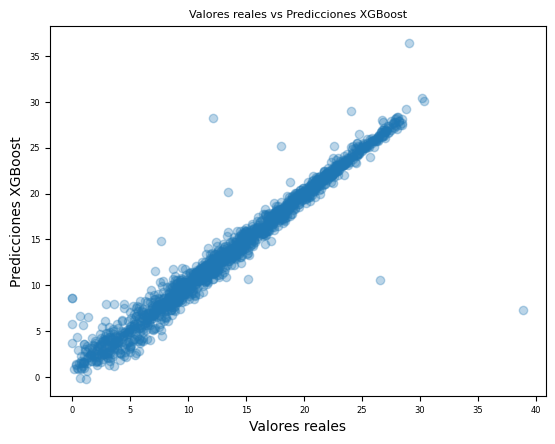

In [ ]:
# Gráfico de Valores Reales vs Predicciones en el conjunto de testeo
#  los valores que se apartan de y=X son errores del modelo

y_hat_xgb = grid_search_xgb.best_estimator_.predict(X_test)
plt.scatter(y_test, y_hat_xgb, alpha=0.3)
plt.xlabel("Valores reales")
plt.ylabel("Predicciones XGBoost")
plt.title("Valores reales vs Predicciones XGBoost")
plt.show()

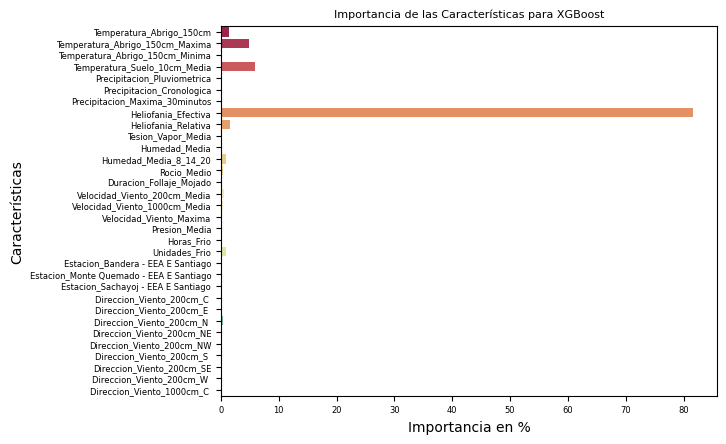

In [ ]:
# Importancia de las características para XGBoost: como todo modelo derivado de los Árboles de Decisión,
# XGBoost tiene un método para determinar la importancia de las características.
# Dicha feature_importances_ indica el ramking de características que más veces eligieron los árboles para decidir

feature_importances = grid_search_xgb.best_estimator_.named_steps['gradientboostingregressor'].feature_importances_
features = X.columns
sns.barplot(x=feature_importances*100, y=features, palette='Spectral')
plt.title('Importancia de las Características para XGBoost')
plt.xlabel('Importancia en %')
plt.ylabel('Características')
plt.show()

In [ ]:
print(f'Importancia de Características')
importance_xgbt=[]
for feat, val in zip(features, feature_importances):
    print(f'Característica: {feat} - Importancia: {round(val,4)*100}')
    importance_xgbt.append([feat, val])


Importancia de Características
Característica: Temperatura_Abrigo_150cm - Importancia: 1.3299999999999998
Característica: Temperatura_Abrigo_150cm_Maxima - Importancia: 4.81
Característica: Temperatura_Abrigo_150cm_Minima - Importancia: 0.12
Característica: Temperatura_Suelo_10cm_Media - Importancia: 5.92
Característica: Precipitacion_Pluviometrica - Importancia: 0.11
Característica: Precipitacion_Cronologica - Importancia: 0.02
Característica: Precipitacion_Maxima_30minutos - Importancia: 0.05
Característica: Heliofania_Efectiva - Importancia: 81.67
Característica: Heliofania_Relativa - Importancia: 1.54
Característica: Tesion_Vapor_Media - Importancia: 0.03
Característica: Humedad_Media - Importancia: 0.15
Característica: Humedad_Media_8_14_20 - Importancia: 0.8500000000000001
Característica: Rocio_Medio - Importancia: 0.27999999999999997
Característica: Duracion_Follaje_Mojado - Importancia: 0.16
Característica: Velocidad_Viento_200cm_Media - Importancia: 0.6
Característica: Velocid

Gráfico de Residuos XGBoost

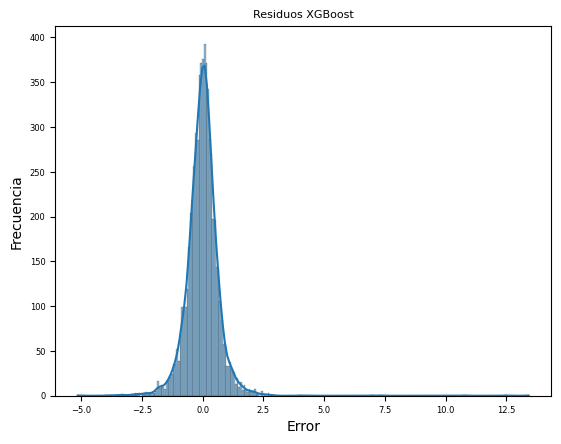

In [ ]:
# Residuos XGBoost
residuos_xgbt=y_train - y_pred_xgb
sns.histplot(residuos_xgbt, kde=True)
plt.title("Residuos XGBoost")
plt.xlabel("Error")
plt.ylabel("Frecuencia")
plt.show()


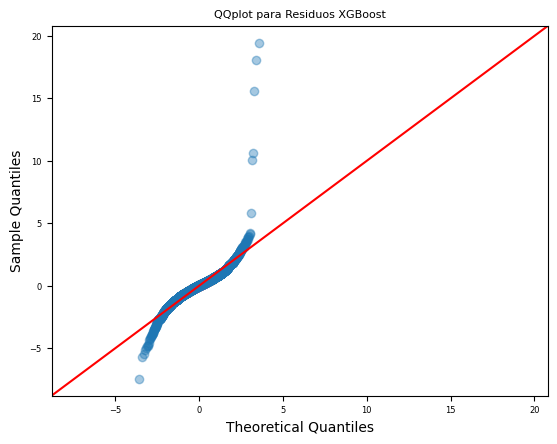

In [ ]:
#QQ Plot de los residuos

sm.qqplot(residuos_xgbt, fit = True, line = '45', alpha = 0.4, lw = 2)
plt.title('QQplot para Residuos XGBoost')
plt.show()

Los residuos no muestran una distribución normal.

In [ ]:
# Cálculo de R2 ajustado
# Seleccionar características con una importancia mayor que 2 en diez mil
# (0.0002, es decir que se hayan usado al menos una vez para tomar decisiones)

most_important=[[feat, val] for feat, val in importance_xgbt if val>0.0002]
#most_important
print(f'R2 ajustado = {adj_r2(grid_search_xgb.best_score_, X_train.shape[0], len(most_important))}')

R2 ajustado = 0.9392836398754282


RESUMEN DE LOS RESULTADOS DE XGBOOST CON VALIDACIÓN CRUZADA E IMPORTANCIA DE CARACTERÍSTICAS

* El mejor modelo usa learning_rate=0.2, max_depth=3, y n_estimators=300.
* El error cuadrático medio (MSE) es 0.4762. Es menor que el de SVR, indicando mejor precisión en las predicciones.
* El coeficiente de determinación ajustado (adjust-R²) es 0.9393, lo que nos dice que este modelo explica casi el 94% de la variabilidad de los datos. Es superior al obtenido para SVR.
* La cantidad de características que XGBoost usa más de una vez para tomar decisiones es mayor que las características que selecciona SelectKBest (24 para XGBoost, 3 para SelectKBest), aunque su adjust-R² es mejor. Cabe destacar que ambos métodos usan distinto criterio para la selección de las características más relevantes.

CONSTRUCCIÓN DE MODELO XGBOOST CON LAS CARACTERÍSTICAS SELECCIONADAS POR SELECT K BEST

In [ ]:
# Separamos las características seleccionadas por SelectKBest
# dentro del cjto de entrenamiento por el ìndice de la columna
X_sel_train=X_train[car_names]
X_sel_test=X_test[car_names]

#Entrenamos el nuevo modelo de XGBoost
pipe_opt=make_pipeline(StandardScaler(), grid_search_xgb.best_estimator_)
pipe_opt.fit(X_sel_train, y_train)


Pipeline(steps=[('standardscaler', StandardScaler()),
                ('pipeline',
                 Pipeline(steps=[('standardscaler', StandardScaler()),
                                 ('gradientboostingregressor',
                                  GradientBoostingRegressor(learning_rate=0.2,
                                                            n_estimators=300))]))])

Métricas de entrenamiento XGBoost optimizado

In [ ]:
y_pred_opt=pipe_opt.predict(X_sel_train)

mse_opt = mean_squared_error(y_train, y_pred_opt)
r2_opt = r2_score(y_train, y_pred_opt)

print(f"Error cuadrático medio XGBoost: {mse_opt}")
print(f"R2 XGBoost: {r2_opt}")
print(f"R2 ajustado: {adj_r2(r2_opt, X_sel_train.shape[0], X_sel_train.shape[1])}")


Error cuadrático medio XGBoost: 2.169221122849831
R2 XGBoost: 0.9562267944450008
R2 ajustado: 0.9562059368184657


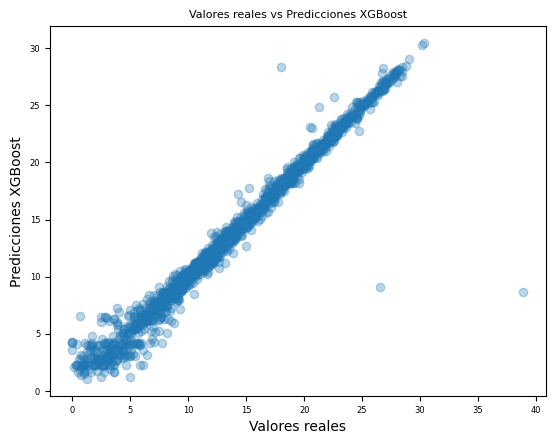

In [ ]:
# Gráfico de Valores Reales vs Predicciones en el conjunto de testeo
#  los valores que se apartan de y=X son errores del modelo

y_hat_xgb = pipe_opt.predict(X_sel_test)
plt.scatter(y_test, y_hat_xgb, alpha=0.3)
plt.xlabel("Valores reales")
plt.ylabel("Predicciones XGBoost")
plt.title("Valores reales vs Predicciones XGBoost")
plt.show()

Para hacer una selección más concienzuda del modelo de regresión, podemos calcular el AIC (Akaike Information Criteria), el cual hace una estimación sobre la calidad del modelo equilibrando la complejidad del mismo y la bondad del ajuste. Penaliza el modelo más complejo frente a una bondad de ajuste comparable.

El criterio de aplicación de AIC es cuanto más chico, mejor ('lower is better').

AIC se calcula como sigue:


AIC = -2 * log(L) + 2 * k

donde 'L' es la máxima probabilidad del modelo que mide la bondad del ajuste del modelo sobre los datos y 'k' es el número de parámetros del modelo (incluyendo la ordenada al origen y cualquier predictor adicional).

Como suele ser difícil calcular 'L', se usa la suma de los errores cuadráticos (SSE) en su lugar. AIC queda entonces así:

AIC = n * ln(SSE/n) + 2 * k

In [ ]:
def aic(mse, k, n):
    '''Retorna AIC y recibe como parámetros mse, k, n'''
    return n*np.log(mse) + 2*k

Calcularemos los AIC para cada uno de los modelos implementados para determinar cuál es el modelo más competente.

In [ ]:
print(f'AIC - SVR : {aic(mse_svr, 4, X_train.shape[0])}')
print(f'AIC - XGBoost : {aic(mse_xgb, len(most_important), X_train.shape[0])}')
print(f'AIC - opt_xbgt : {aic(mse_opt, 4, X_train.shape[0])}')


AIC - SVR : 7482.259552170802
AIC - XGBoost : -4627.482232750032
AIC - opt_xbgt : 4886.519493424505


Si consideramos AIC como criterio de selección de modelos, el modelo de XGBoost con todas las características (sin selección previa) es el mejor de los tres ensayados.

Comentario

En la documentación de Scikit-Learn se puede ver un ejemplo donde se discute una comparación entre SVR y Ridge Regression. Este modelo podría ser una alternativa interesante para explorar usando este dataset.

https://scikit-learn.org/stable/auto_examples/miscellaneous/plot_kernel_ridge_regression.html

### Conclusiones generales

* XGBoost supera a SVR en todos los aspectos, con menor error y mayor capacidad predictiva.
* SVR es un modelo competente, pero XGBoost logra un mejor ajuste con los datos.
* Para aplicaciones donde la precisión es clave, XGBoost es la mejor opción.
* El tiempo de cómputo de XGBoost puede ser mayor (sin considerar la selección de características), pero la mejora en precisión justifica su uso.
